# Introdução

A Fórmula 1 é a principal categoria do automobilismo mundial, os 20 melhores pilotos do planeta disputam pelo título de Campeão do Mundo anualmente. A F1 (como também é conhecida), é de interesse global e, portanto, prever seus resultados é do interesse de milhares de espectadores espalhados pelo planeta; aqui, propõe-se a utilização do resultado de corridas anteriores para prever a corrida seguinte, o que representa uma característica importante da F1: a diferença entre os carros.

A Fórmula 1 não é uma categoria de especificação (como são chamadas as categorias em que os carros são, para todos os propósitos, idênticos, como a Fórmula 2 e a Fórmula 3, por exemplo), assim, não são poucos os casos em que um determinado carro é objetivamente melhor que o de outra equipe, assim, partindo do pressuposto que um piloto corra todas as corridas de uma temporada por uma mesma equipe, é possível intuir que os seus resultado fiquem sempre em torno de uma mesma faixa (a depender de atualizações que ocorrem durante a temporada, que já transformaram equipes que estavam no fundo do pelotão em ponteiros em questão de algumas corridas).

Desta forma, serão utilizados para previsão o resultado das corridas anteriores bem como a sua média (com tamanhos a serem definidos no momento da seleção de variáveis), eventualmente, serão adicionados dados do grid de largada, classificação, treinos livres e resultados de corridas sprint, sempre verificando se as variáveis realmente auxiliam o modelo.

# Bibliotecas

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import ruptures as rpt

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.naive_bayes import CategoricalNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import RadiusNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import NuSVC
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

# Funções

In [33]:
def changepoint(data, x, y):  # a série tem o "patamar novo" do ponto detectado em diante
    model = "rbf"
    algo = rpt.Pelt(model=model).fit(data[y].values)
    result = algo.predict(pen = 2 * np.log(len(data[x])))

    fig = px.line(data, x=x, y=y)
    fig.add_vline(x=data.iloc[0][x])

    for resul in result:
        fig.add_vline(x=data.iloc[resul-1][x])

    fig.show()

def plot(pred, rf, title):
    for i in pred.values:
        y_pred = rf.predict_proba([i])  # prevê
        print(np.dot(list(range(1, len(y_pred[0]))), y_pred[0][:-1]))
        fig = go.Figure()
        l = list(range(1, len(y_pred[0].tolist())))
        fig.add_trace(go.Bar(
            x=l,
            y=y_pred[0],
            text=np.round(y_pred[0] * 100, decimals = 2).astype(str)
        ))
        fig.update_traces(textposition='outside')
        fig.update_layout(title=title,
                         xaxis_title='Position',
                         yaxis_title='Percentage',
                         xaxis_type='category',
                         autosize=False,
                         height=700,
                         width=1000
                         )
        fig.show()# plota

# Pré-processamento

In [5]:
# importa a base
# cria coluna com a corrida anterior (cria bases diferentes indo até 10 corridas anteriores)
    # seleciona o ano, a rodada, a equipe e o piloto
    # se for a primeira rodada, ou o piloto não participou da rodada anterior na mesma equipe, continua
    # se não, procura a posição do piloto na rodada anterior e adiciona
    # para lags maiores que 1, calcula a média das rodadas anteriores
        # exemplo: lag 4, calcula a média de 2, 3 e 4 rodadas
# testa diferentes modelos com as diferentes bases
    # faz a seleção de variáveis para encontrar o melhor modelo em cada caso
df = pd.read_csv("D:\\Esportes\\F1\\F1 db\\f1db-csv\\f1db-races-race-results.csv")
df["positionNumber"].fillna(100, inplace=True)
#df.dropna(subset=["positionNumber"], inplace=True)
df["ID"] = df["driverId"] + df["constructorId"] + df["engineManufacturerId"]
df["race-1"] = np.nan
df.drop_duplicates(subset=["year", "round", "ID"], inplace=True)
df = df[df["year"] >= 1989]  # resultado da análise de ponto de mudança
# 15 anos de treino, 4 de teste, 2 de validação
df

C:\Users\yan_k\AppData\Local\Temp\ipykernel_11024\3717127998.py:10: DtypeWarning: Columns (31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("D:\\Esportes\\F1\\F1 db\\f1db-csv\\f1db-races-race-results.csv")
C:\Users\yan_k\AppData\Local\Temp\ipykernel_11024\3717127998.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["positionNumber"].fillna(100, inplace=True)


,raceId,year,round,positionDisplayOrder,positionNumber,positionText,driverNumber,driverId,constructorId,engineManufacturerId,...,qualificationPositionText,gridPositionNumber,gridPositionText,positionsGained,pitStops,fastestLap,driverOfTheDay,grandSlam,ID,race-1
11852,469,1989,1,1,1.0,1,27,nigel-mansell,ferrari,ferrari,...,6,6.0,6,5.0,NaN,False,NaN,False,nigel-mansellferrariferrari,NaN
11853,469,1989,1,2,2.0,2,2,alain-prost,mclaren,honda,...,5,5.0,5,3.0,NaN,False,NaN,False,alain-prostmclarenhonda,NaN
11854,469,1989,1,3,3.0,3,15,mauricio-gugelmin,march,judd,...,12,12.0,12,9.0,NaN,False,NaN,False,mauricio-gugelminmarchjudd,NaN
11855,469,1989,1,4,4.0,4,20,johnny-herbert,benetton,ford,...,10,10.0,10,6.0,NaN,False,NaN,False,johnny-herbertbenettonford,NaN
11856,469,1989,1,5,5.0,5,9,derek-warwick,arrows,ford,...,8,8.0,8,3.0,NaN,False,NaN,False,derek-warwickarrowsford,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27126,1141,2025,16,16,16.0,16,10,pierre-gasly,alpine,renault,...,19,NaN,PL,4.0,1.0,False,False,False,pierre-gaslyalpinerenault,NaN
27127,1141,2025,16,17,17.0,17,43,franco-colapinto,alpine,renault,...,18,17.0,17,0.0,1.0,False,False,False,franco-colapintoalpinerenault,NaN
27128,1141,2025,16,18,18.0,18,18,lance-stroll,aston-martin,mercedes,...,17,16.0,16,-2.0,1.0,False,False,False,lance-strollaston-martinmercedes,NaN
27129,1141,2025,16,19,100.0,DNF,14,fernando-alonso,aston-martin,mercedes,...,9,8.0,8,NaN,1.0,False,False,False,fernando-alonsoaston-martinmercedes,NaN


In [6]:
# escrever para mais corrida anteriores

for ano in df["year"].unique():
    for id in df[df["year"] == ano]["ID"].unique():
        if len(df[(df["year"] == ano) & (df["ID"] == id)]) == 1:
            df = df.drop(df[(df["year"] == ano) & (df["ID"] == id)].index)
            
        else:
            df.sort_values("round", inplace=True, ascending=True)
            
            for i in range(len(df[(df["year"] == ano) & (df["ID"] == id)]) - 1):
                l = len(df[(df["year"] == ano) & (df["ID"] == id)]) - 1
                round = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 1)), 2].tolist()
                df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-1"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 2)), 4]

                if i < l - 1:  # 2 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-2"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 3)), 4]
                if i < l - 2:  # 3 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-3"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 4)), 4]
                if i < l - 3:  # 4 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-4"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 5)), 4]
                if i < l - 4:  # 5 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-5"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 6)), 4]
                if i < l - 5:  # 6 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-6"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 7)), 4]
                if i < l - 6:  # 7 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-7"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 8)), 4]
                if i < l - 7:  # 8 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-8"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 9)), 4]
                if i < l - 8:  # 9 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-9"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 10)), 4]
                if i < l - 9:  # 10 corridas
                    df.loc[df[(df["year"] == ano) & (df["ID"] == id) & (df["round"] == round)].index, "race-10"] = df[(df["year"] == ano) & (df["ID"] == id)].iloc[int(-1 * (i + 11)), 4]
            # pega a primeira linha, adiciona o resultado da segunda
            # repete até a penultima linha
#df.dropna(subset=["race-1"], inplace=True)
data = df[df["raceId"] == max(df["raceId"])]
df = df[(df["positionNumber"] != 100) & (df["raceId"] != max(df["raceId"]))]
df = pd.concat([df, data])

In [7]:
df["ma2"] = (df["race-1"] + df["race-2"])/2
df["ma3"] = (df["race-1"] + df["race-2"] + df["race-3"])/3
df["ma4"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"])/4
df["ma5"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"] + df["race-5"])/5
df["ma6"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"] + df["race-5"] + df["race-6"])/6
df["ma7"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"] + df["race-5"] + df["race-6"] + df["race-7"])/7
df["ma8"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"] + df["race-5"] + df["race-6"] + df["race-7"] + df["race-8"])/8
df["ma9"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"] + df["race-5"] + df["race-6"] + df["race-7"] + df["race-8"] + df["race-9"])/9
df["ma10"] = (df["race-1"] + df["race-2"] + df["race-3"] + df["race-4"] + df["race-5"] + df["race-6"] + df["race-7"] + df["race-8"] + df["race-9"] + df["race-10"])/10

# Análise exploratória

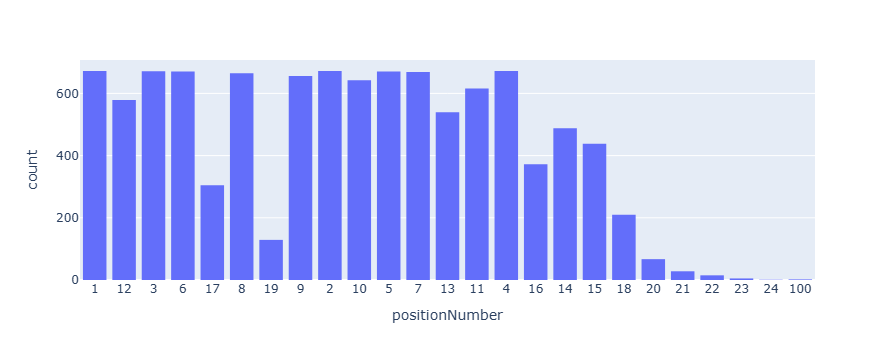

In [20]:
# balanceamento das classes
fig = px.histogram(df, x="positionNumber")
fig.update_layout(xaxis_type='category')
fig.show()

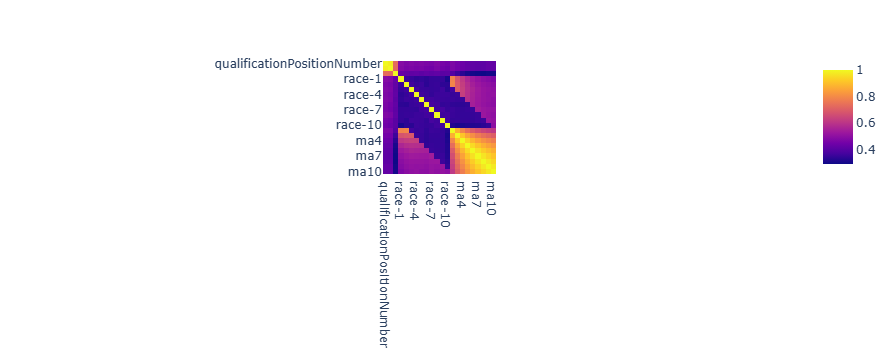

In [21]:
corr = df[["qualificationPositionNumber", "gridPositionNumber", "positionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10", "ma2", "ma3", "ma4", "ma5", "ma6", "ma7", "ma8", "ma9", "ma10"]].corr(method = "spearman")
fig = px.imshow(corr, text_auto=True)
fig.show()

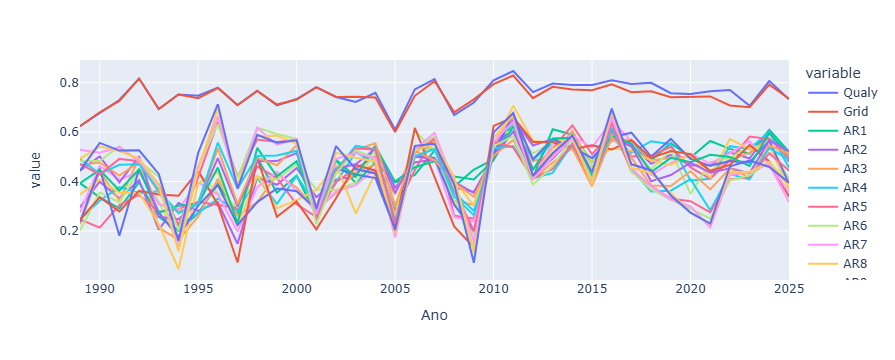

In [22]:
l = []
for ano in df["year"].unique():
    l.append([ano, df[df["year"] == ano][["positionNumber", "qualificationPositionNumber"]].corr(method="spearman")["qualificationPositionNumber"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "gridPositionNumber"]].corr(method="spearman")["gridPositionNumber"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-1"]].corr(method="spearman")["race-1"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-2"]].corr(method="spearman")["race-2"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-3"]].corr(method="spearman")["race-3"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-4"]].corr(method="spearman")["race-4"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-5"]].corr(method="spearman")["race-5"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-6"]].corr(method="spearman")["race-6"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-7"]].corr(method="spearman")["race-7"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-8"]].corr(method="spearman")["race-8"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-9"]].corr(method="spearman")["race-9"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "race-10"]].corr(method="spearman")["race-10"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma2"]].corr(method="spearman")["ma2"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma3"]].corr(method="spearman")["ma3"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma4"]].corr(method="spearman")["ma4"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma5"]].corr(method="spearman")["ma5"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma6"]].corr(method="spearman")["ma6"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma7"]].corr(method="spearman")["ma7"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma8"]].corr(method="spearman")["ma8"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma9"]].corr(method="spearman")["ma9"].values.tolist()[0]
              , df[df["year"] == ano][["positionNumber", "ma10"]].corr(method="spearman")["ma10"].values.tolist()[0]])

corrDf = pd.DataFrame(l, columns=["Ano", "Qualy", "Grid", "AR1", "AR2", "AR3", "AR4", "AR5", "AR6", "AR7", "AR8", "AR9", "AR10", "MA2", "MA3", "MA4", "MA5", "MA6", "MA7", "MA8", "MA9", "MA10"])

corrDf.sort_values("Ano", inplace=True)

fig = px.line(corrDf, x="Ano", y=["Qualy", "Grid", "AR1", "AR2", "AR3", "AR4", "AR5", "AR6", "AR7", "AR8", "AR9", "AR10", "MA2", "MA3", "MA4", "MA5", "MA6", "MA7", "MA8", "MA9", "MA10"])
fig.show()

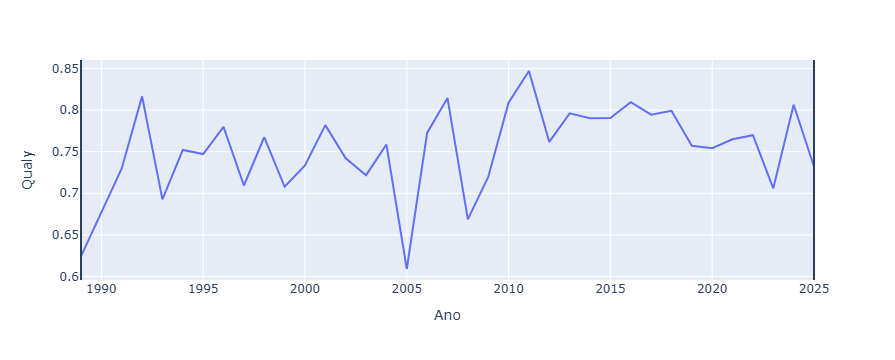

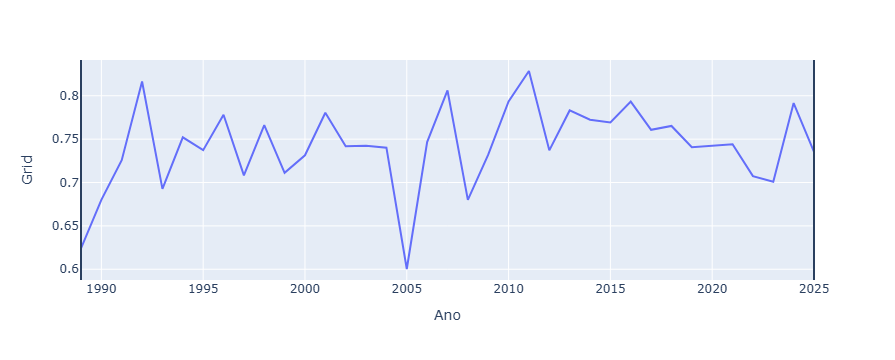

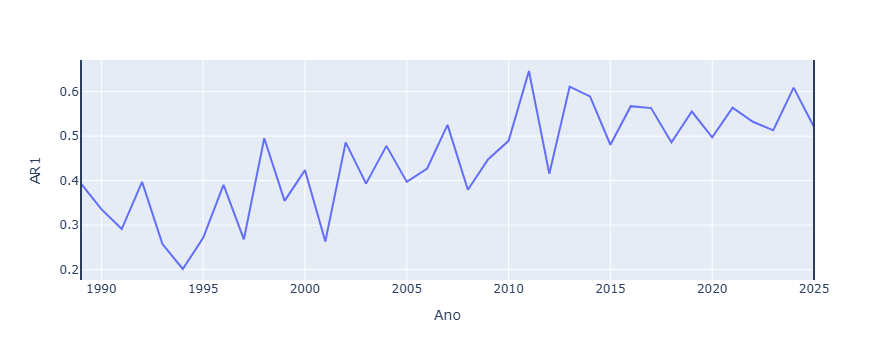

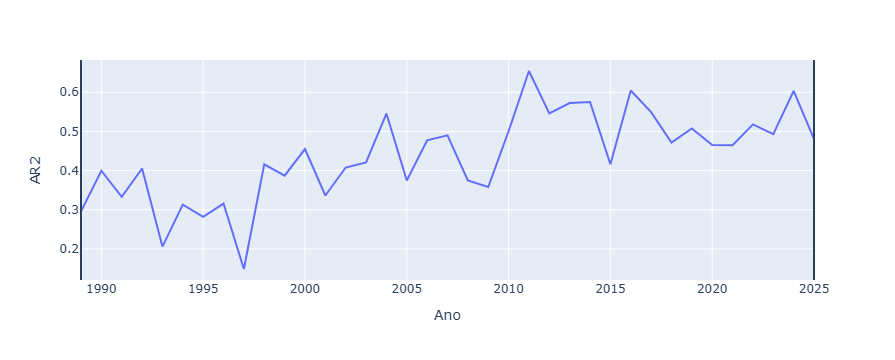

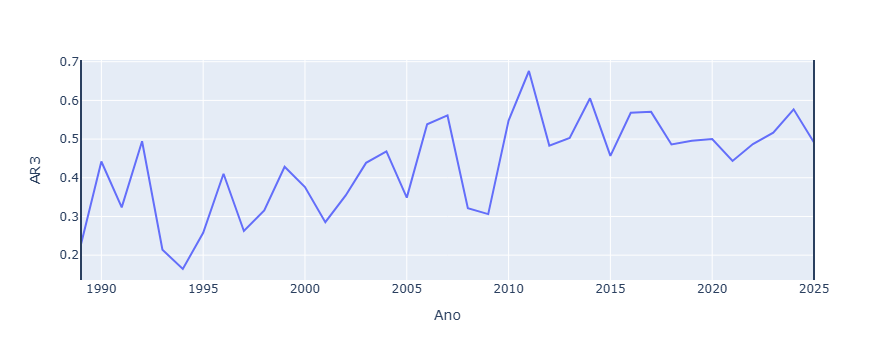

...

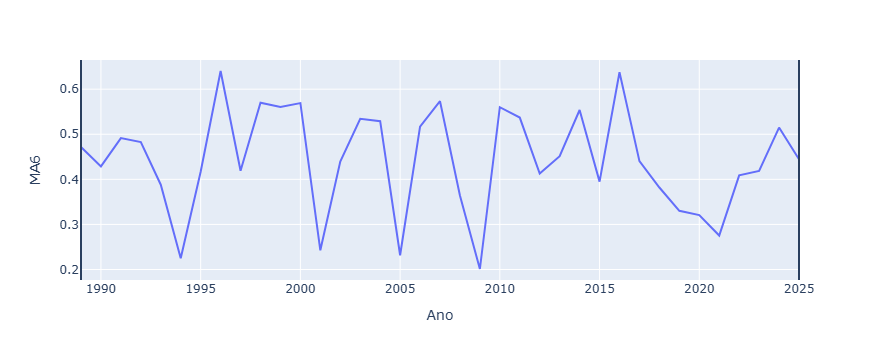

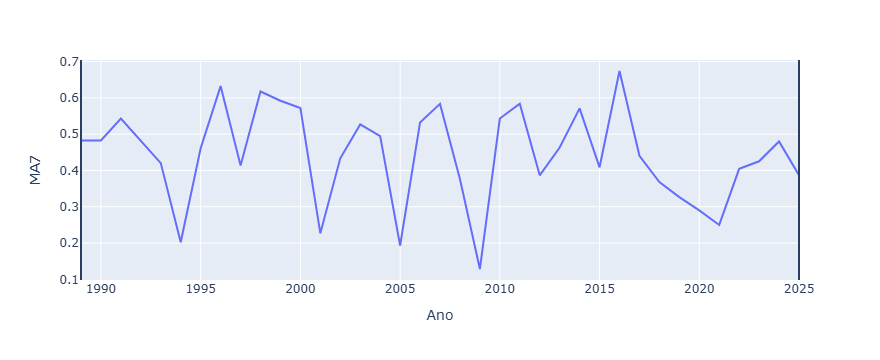

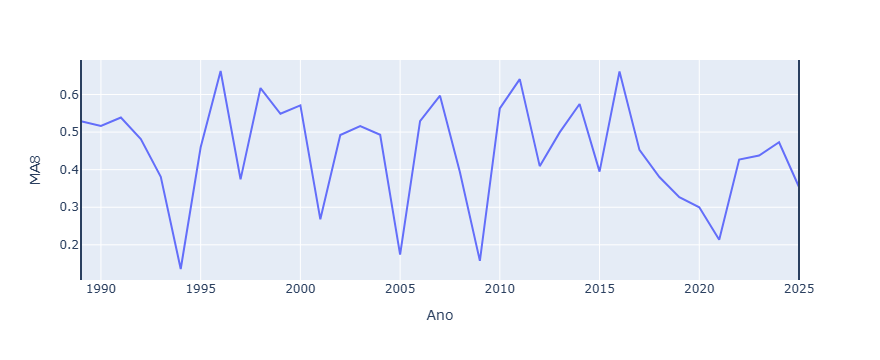

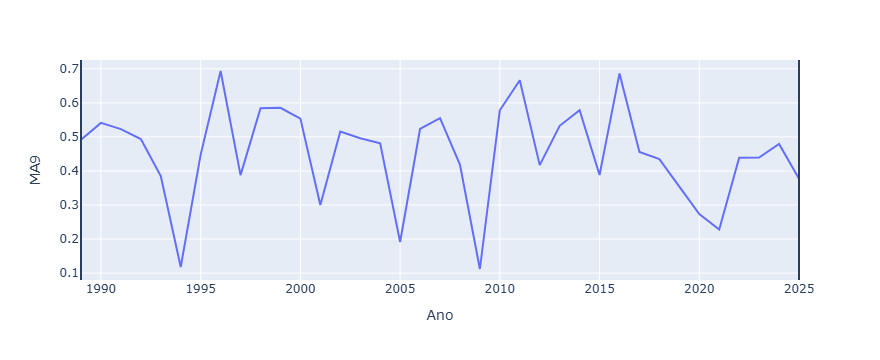

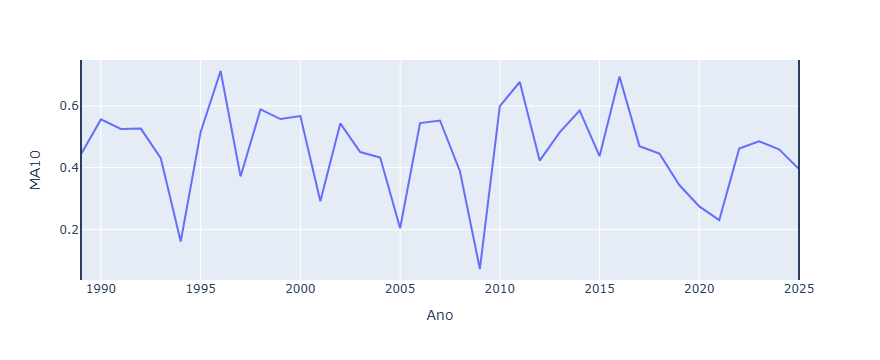

In [23]:
l = ["Qualy", "Grid", "AR1", "AR2", "AR3", "AR4", "AR5", "AR6", "AR7", "AR8", "AR9", "AR10", "MA2", "MA3", "MA4", "MA5", "MA6", "MA7", "MA8", "MA9", "MA10"]

for i in l:
    changepoint(corrDf, "Ano", y=i)

# Modelagem

## Processo Gaussiano

In [34]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = GaussianProcessClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = GaussianProcessClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.1830178474851271
0.14548404542996216
3-lags
0.34033418426549084
0.15293571594337432
4-lags
0.5524510415367344
0.16265435948609205
5-lags
0.6558283864004317
0.167835941716136
6-lags
0.6978375219170077
0.17372881355932204
7-lags
0.7092651757188498
0.17028753993610224
8-lags
0.706784140969163
0.17762114537444934
9-lags
0.6969519343493552
0.16744822196170378
10-lags
0.6853808894760017
0.162703654777631


## Regressão Logistica (Multinomial)

Melhor modelo: corridas 1 a 10

In [84]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = LogisticRegression(solver='newton-cg')
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = LogisticRegression(solver='newton-cg')
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.07961060032449974
0.07917793401838832
3-lags
0.08273381294964029
0.09097238338361568
4-lags
0.08781339653236872
0.08694025196457528
5-lags
0.09079870480302213
0.083917970858068
6-lags
0.09395090590298072
0.08372296902396259
7-lags
0.09281150159744408
0.08594249201277955
8-lags
0.09550660792951542
0.08334801762114537
9-lags
0.09788980070339977
0.08401719421649081
10-lags
0.0959929546455306
0.0845442536327609


## Naive Bayes
Melhor modelo: corridas 1 a 10

In [86]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = CategoricalNB()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = CategoricalNB()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.15305570578691186
0.14256354786371012
3-lags
0.16500348108609886
0.15235553492689718
4-lags
0.18797555195210178
0.15928651615317452
5-lags
0.19913653534808418
0.16473286562331355
6-lags
0.21274108708357686
0.16817650496785505
7-lags
0.22124600638977635
0.17012779552715654
8-lags
0.23541850220264318
0.17162995594713656
9-lags
0.2534193044157874
0.1652989449003517
10-lags
0.25891677675033026
0.16160281814178776


## Radius-Neighbors

In [45]:
melhorMa = 0
melhorAr = 0
for w in ['uniform', 'distance']:
    for d in ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan', 'nan_euclidean']:
        for k in np.arange(0.1, 10, 0.1):
            for i in range(1, 11):
                #print(f"{i}-lags")
                l = []
                for j in range(i, 0, -1):
                    #if j > 1:
                    #    l.append(f"ma{j}")
                    l.append(f"race-{j}")
            
                #print(l)
                df1 = df.dropna(subset=l)
                
                dfTrain = df1[(df1["year"] <= 2016)]
                dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
                dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]

                try:
                    rf = RadiusNeighborsClassifier(radius=k, weights=w, metric=d)
                    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
                    acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))

                except:
                    continue
                    
                if acc > melhorAr:
                    melhorAr = acc
                    print(f"{i}-lags (AR)")
                    print(w)
                    print(d)
                    print(k)
                    print(acc)
                    print("\n")

                if i == 1:
                    continue
                
                l = [f"ma{i}"]
                
                df2 = df.dropna(subset=l)
                
                dfTrain = df1[(df1["year"] <= 2016)]
                dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
                dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]

                try:
                    rf = RadiusNeighborsClassifier(radius=k, weights=w, metric=d)
                    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
                    acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))

                except:
                    continue
                    
                if acc > melhorMa:
                    melhorMa = acc
                    print(f"{i}-lags (MA)")
                    print(w)
                    print(d)
                    print(k)
                    print(acc)
                    print("\n")

1-lags (AR)
uniform
cityblock
0.1
0.13008706215833166


2-lags (AR)
uniform
cityblock
1.0
0.16127636560302866


2-lags (MA)
uniform
cityblock
1.0
0.13672255273120607


2-lags (MA)
uniform
cityblock
1.5000000000000002
0.13780421849648458


4-lags (AR)
uniform
cityblock
7.0
0.17425470874391918


5-lags (AR)
uniform
euclidean
7.9
0.17943874797625473


6-lags (AR)
uniform
euclidean
8.8
0.2020748100526008


6-lags (AR)
uniform
euclidean
8.9
0.20295149035651666


6-lags (AR)
uniform
euclidean
9.0
0.2033898305084746


2-lags (MA)
distance
cityblock
1.0
0.14883720930232558


3-lags (AR)
distance
cityblock
5.0
0.3832675794847993


3-lags (MA)
distance
cityblock
5.0
0.16488744488280344


3-lags (AR)
distance
cityblock
6.0
0.38373172429798097


4-lags (AR)
distance
cityblock
7.0
0.5802669327678682


4-lags (MA)
distance
cityblock
7.0
0.18473244355744045


4-lags (AR)
distance
cityblock
8.0
0.5806411375826369


4-lags (AR)
distance
cityblock
9.0
0.5810153423974055


5-lags (AR)
distance
cosine
0.1

## K-Vizinhos
Melhor modelo: 1 vizinho, corridas 1 a 4 (o resto literalmente não importa)

In [88]:
melhorMa = 0
melhorAr = 0
for w in ['uniform', 'distance']:
    for d in ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan', 'nan_euclidean']:
        for k in range(1, 11):
            for i in range(1, 11):
                #print(f"{i}-lags")
                l = []
                for j in range(i, 0, -1):
                    #if j > 1:
                    #    l.append(f"ma{j}")
                    l.append(f"race-{j}")
            
                #print(l)
                df1 = df.dropna(subset=l)
                
                dfTrain = df1[(df1["year"] <= 2016)]
                dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
                dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
                
                rf = KNeighborsClassifier(n_neighbors=k, weights=w, metric=d)
                rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
                acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
                if acc > melhorAr:
                    melhorAr = acc
                    print(f"{i}-lags (AR)")
                    print(w)
                    print(d)
                    print(k)
                    print(acc)
                    print("\n")

                if i == 1:
                    continue
                
                l = [f"ma{i}"]
                
                df2 = df.dropna(subset=l)
                
                dfTrain = df1[(df1["year"] <= 2016)]
                dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
                dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
                
                rf = KNeighborsClassifier(n_neighbors=k, weights=w, metric=d)
                rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
                acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
                if acc > melhorMa:
                    melhorMa = acc
                    print(f"{i}-lags (MA)")
                    print(w)
                    print(d)
                    print(k)
                    print(acc)
                    print("\n")

1-lags (AR)
uniform
cityblock
1
0.0845312816359587


2-lags (AR)
uniform
cityblock
1
0.13358572201189833


2-lags (MA)
uniform
cityblock
1
0.09724175229853975


3-lags (AR)
uniform
cityblock
1
0.3469482478533302


3-lags (MA)
uniform
cityblock
1
0.11058250174054304


4-lags (AR)
uniform
cityblock
1
0.564300860671074


4-lags (MA)
uniform
cityblock
1
0.1299738056629662


5-lags (AR)
uniform
cityblock
1
0.6612250404749056


5-lags (MA)
uniform
cityblock
1
0.13667026443604965


6-lags (AR)
uniform
cityblock
1
0.6991525423728814


6-lags (MA)
uniform
cityblock
1
0.16072472238457042


7-lags (AR)
uniform
cityblock
1
0.7084664536741214


7-lags (MA)
uniform
cityblock
1
0.17268370607028755


8-lags (MA)
uniform
cityblock
1
0.19365638766519824


9-lags (MA)
uniform
cityblock
1
0.20808909730363423


10-lags (MA)
uniform
cityblock
1
0.22567151034786437


10-lags (MA)
uniform
cityblock
2
0.2289740202553941


10-lags (MA)
uniform
cityblock
6
0.23029502421840597


7-lags (AR)
uniform
euclidean
1
0.

## Histogram Gradient Boosting

In [54]:
melhorMa = 0
melhorAr = 0
for c in ['log_loss']:
    for f in range(1, 2):
        for i in range(2, 11):
            print(f"rodada {f}")
            l = []
            for j in range(i, 0, -1):
                #if j > 1:
                #    l.append(f"ma{j}")
                l.append(f"race-{j}")
        
            #print(l)
            df1 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = GradientBoostingClassifier(loss = c)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorAr:
                melhorAr = acc
                print(f"{i}-lags (AR)")
                print(c)
                print(f)
                print(acc)
        
            l = [f"ma{i}"]
            
            df2 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = GradientBoostingClassifier(loss = c)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorMa:
                melhorMa = acc
                print(f"{i}-lags (MA)")
                print(c)
                print(f)
                print(acc)

rodada 1
2-lags (AR)
log_loss
1
0.17414818820984315
2-lags (MA)
log_loss
1
0.14894537587885343
rodada 1
3-lags (AR)
log_loss
1
0.2104896727779067
3-lags (MA)
log_loss
1
0.16326293803666744
rodada 1
4-lags (AR)
log_loss
1
0.2543345391044031
4-lags (MA)
log_loss
1
0.1837345640513908
rodada 1
5-lags (AR)
log_loss
1
0.2892606583917971
5-lags (MA)
log_loss
1
0.19603345925526175
rodada 1
6-lags (AR)
log_loss
1
0.31545879602571597
6-lags (MA)
log_loss
1
0.20689655172413793
rodada 1
7-lags (AR)
log_loss
1
0.3539936102236422
7-lags (MA)
log_loss
1
0.21964856230031948
rodada 1
8-lags (AR)
log_loss
1
0.3950660792951542
8-lags (MA)
log_loss
1
0.23330396475770926
rodada 1
9-lags (AR)
log_loss
1
0.4271199687377882
9-lags (MA)
log_loss
1
0.235052754982415
rodada 1
10-lags (AR)
log_loss
1
0.47512109202994274
10-lags (MA)
log_loss
1
0.24856891237340378


## NuSVC

In [87]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    try:
        rf = NuSVC(nu=0.9)
        rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
        print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))
    
    except:
        continue
        
    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]

    try:
        rf = NuSVC(nu=0.9)
        rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
        print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))
    
    except:
        continue

2-lags
3-lags
4-lags
5-lags
6-lags
7-lags
8-lags
9-lags
10-lags


## SVC

In [77]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = SVC()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = SVC()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.10968090859924283
0.11238507301243916
3-lags
0.11441169644929218
0.10385240194940822
4-lags
0.11725084196083323
0.08581763752026943
5-lags
0.11656772800863464
0.08432271991365353
6-lags
0.1260958503798948
0.08284628872004676
7-lags
0.13722044728434504
0.0878594249201278
8-lags
0.14801762114537445
0.09762114537444934
9-lags
0.16451738960531456
0.08909730363423213
10-lags
0.18339938353148394
0.09731395860854249


## SVC Linear

In [81]:
melhorMa = 0
melhorAr = 0
for c in ['hinge', 'squared_hinge']:
    for f in ['l1', 'l2']:
        for i in range(2, 11):
            if f == 'l1' and c == 'hinge':
                continue
            
            print(f"rodada {f}")
            l = []
            for j in range(i, 0, -1):
                #if j > 1:
                #    l.append(f"ma{j}")
                l.append(f"race-{j}")
        
            #print(l)
            df1 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = LinearSVC(loss = c, penalty = f)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorAr:
                melhorAr = acc
                print(f"{i}-lags (AR)")
                print(c)
                print(f)
                print(acc)
        
            l = [f"ma{i}"]
            
            df2 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = LinearSVC(loss = c, penalty = f)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorMa:
                melhorMa = acc
                print(f"{i}-lags (MA)")
                print(c)
                print(f)
                print(acc)

rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



2-lags (AR)
hinge
l2
0.06327744726879395


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



2-lags (MA)
hinge
l2
0.06327744726879395
rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l2


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



rodada l1
2-lags (AR)
squared_hinge
l1
0.07993510005408329
2-lags (MA)
squared_hinge
l1
0.07917793401838832
rodada l1
3-lags (AR)
squared_hinge
l1
0.08540264562543513
3-lags (MA)
squared_hinge
l1
0.09190067300997912
rodada l1
4-lags (AR)
squared_hinge
l1
0.08856180616190595
rodada l1
rodada l1
6-lags (AR)
squared_hinge
l1
0.09088252483927528
rodada l1
7-lags (AR)
squared_hinge
l1
0.09249201277955271
rodada l1
8-lags (AR)
squared_hinge
l1
0.09427312775330396
rodada l1
9-lags (AR)
squared_hinge
l1
0.09574052364204767
rodada l1
10-lags (AR)
squared_hinge
l1
0.0959929546455306
rodada l2
rodada l2
rodada l2
rodada l2
rodada l2
rodada l2
rodada l2
rodada l2
rodada l2


## Gradient Boosting

In [55]:
melhorMa = 0
melhorAr = 0
for c in ['log_loss']:
    for f in ['friedman_mse', 'squared_error']:
        for i in range(2, 11):
            print(f"rodada {f}")
            l = []
            for j in range(i, 0, -1):
                #if j > 1:
                #    l.append(f"ma{j}")
                l.append(f"race-{j}")
        
            #print(l)
            df1 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = GradientBoostingClassifier(loss = c, criterion = f)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorAr:
                melhorAr = acc
                print(f"{i}-lags (AR)")
                print(c)
                print(f)
                print(acc)
        
            l = [f"ma{i}"]
            
            df2 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = GradientBoostingClassifier(loss = c, criterion = f)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorMa:
                melhorMa = acc
                print(f"{i}-lags (MA)")
                print(c)
                print(f)
                print(acc)

rodada friedman_mse
2-lags (AR)
log_loss
friedman_mse
0.17414818820984315
2-lags (MA)
log_loss
friedman_mse
0.14894537587885343
rodada friedman_mse
3-lags (AR)
log_loss
friedman_mse
0.2104896727779067
3-lags (MA)
log_loss
friedman_mse
0.16326293803666744
rodada friedman_mse
4-lags (AR)
log_loss
friedman_mse
0.2543345391044031
4-lags (MA)
log_loss
friedman_mse
0.1837345640513908
rodada friedman_mse
5-lags (AR)
log_loss
friedman_mse
0.2892606583917971
5-lags (MA)
log_loss
friedman_mse
0.19603345925526175
rodada friedman_mse
6-lags (AR)
log_loss
friedman_mse
0.31545879602571597
6-lags (MA)
log_loss
friedman_mse
0.20689655172413793
rodada friedman_mse
7-lags (AR)
log_loss
friedman_mse
0.3539936102236422
7-lags (MA)
log_loss
friedman_mse
0.21964856230031948
rodada friedman_mse
8-lags (AR)
log_loss
friedman_mse
0.3950660792951542
8-lags (MA)
log_loss
friedman_mse
0.23330396475770926
rodada friedman_mse
9-lags (AR)
log_loss
friedman_mse
0.4271199687377882
9-lags (MA)
log_loss
friedman_mse
0.2

## Extra Trees

In [57]:
melhorMa = 0
melhorAr = 0
for c in ['gini', 'entropy', 'log_loss']:
    for f in range(100, 101):
        for i in range(2, 11):
            print(f"rodada {f}")
            l = []
            for j in range(i, 0, -1):
                #if j > 1:
                #    l.append(f"ma{j}")
                l.append(f"race-{j}")
        
            #print(l)
            df1 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = ExtraTreesClassifier(n_estimators = f, criterion = c)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorAr:
                melhorAr = acc
                print(f"{i}-lags (AR)")
                print(c)
                print(f)
                print(acc)
        
            l = [f"ma{i}"]
            
            df2 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = ExtraTreesClassifier(n_estimators = f, criterion = c)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorMa:
                melhorMa = acc
                print(f"{i}-lags (MA)")
                print(c)
                print(f)
                print(acc)

rodada 100
2-lags (AR)
gini
100
0.18994050838290968
2-lags (MA)
gini
100
0.14883720930232558
rodada 100
3-lags (AR)
gini
100
0.38280343467161754
3-lags (MA)
gini
100
0.16488744488280344
rodada 100
4-lags (AR)
gini
100
0.5777722340027441
4-lags (MA)
gini
100
0.18473244355744045
rodada 100
5-lags (AR)
gini
100
0.6691851052347545
5-lags (MA)
gini
100
0.19724770642201836
rodada 100
6-lags (AR)
gini
100
0.7042665108123904
6-lags (MA)
gini
100
0.21595558153126826
rodada 100
7-lags (AR)
gini
100
0.7119808306709265
7-lags (MA)
gini
100
0.2343450479233227
rodada 100
8-lags (MA)
gini
100
0.24933920704845816
rodada 100
9-lags (MA)
gini
100
0.2557639703008988
rodada 100
10-lags (MA)
gini
100
0.2712461470717745
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
7-lags (AR)
entropy
100
0.7137380191693291
rodada 100
rodada 100
9-lags (AR)
entropy
100
0.7139507620164126
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
10-lags 

## Floresta Aleatória
Corridas 1 a 4, log-loss

In [90]:
melhorMa = 0
melhorAr = 0
for c in ['gini', 'entropy', 'log_loss']:
    for f in range(100, 101):
        for i in range(2, 11):
            print(f"rodada {f}")
            l = []
            for j in range(i, 0, -1):
                #if j > 1:
                #    l.append(f"ma{j}")
                l.append(f"race-{j}")
        
            #print(l)
            df1 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = RandomForestClassifier(n_estimators = f, criterion = c)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorAr:
                melhorAr = acc
                print(f"{i}-lags (AR)")
                print(c)
                print(f)
                print(acc)
        
            l = [f"ma{i}"]
            
            df2 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = RandomForestClassifier(n_estimators = f, criterion = c)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorMa:
                melhorMa = acc
                print(f"{i}-lags (MA)")
                print(c)
                print(f)
                print(acc)

rodada 100
2-lags (AR)
gini
100
0.19048134126554894
2-lags (MA)
gini
100
0.15002704164413197
rodada 100
3-lags (AR)
gini
100
0.38233928985843585
3-lags (MA)
gini
100
0.1643072638663263
rodada 100
4-lags (AR)
gini
100
0.5773980291879756
4-lags (MA)
gini
100
0.18498191343395284
rodada 100
5-lags (AR)
gini
100
0.6664867781975176
5-lags (MA)
gini
100
0.1988667026443605
rodada 100
6-lags (AR)
gini
100
0.7038281706604325
6-lags (MA)
gini
100
0.21712448860315606
rodada 100
7-lags (AR)
gini
100
0.710223642172524
7-lags (MA)
gini
100
0.23610223642172523
rodada 100
8-lags (AR)
gini
100
0.7129515418502202
8-lags (MA)
gini
100
0.2481057268722467
rodada 100
9-lags (AR)
gini
100
0.7135599843688941
9-lags (MA)
gini
100
0.25908558030480655
rodada 100
10-lags (MA)
gini
100
0.27300748568912375
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
8-lags (AR)
entropy
100
0.7138325991189427
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
rodada 100
7-lag

## Rede Neural
Resultados piores, nem vou perder tempo

In [92]:
melhorMa = 0
melhorAr = 0
for hl1 in range(24, 25):
    
    for act in ['identity', 'logistic', 'tanh', 'relu']:
        
        for i in range(2, 11):
            #print(f"{i}-lags")
            l = []
            for j in range(i, 0, -1):
                #if j > 1:
                #    l.append(f"ma{j}")
                l.append(f"race-{j}")
        
            #print(l)
            df1 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = MLPClassifier(hidden_layer_sizes=(hl1, hl1,), activation=act)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorAr:
                melhorAr = acc
                print(f"{i}-lags (AR)")
                print(hl1)
                print(act)
                print(acc)
                print("\n")
        
            l = [f"ma{i}"]
            
            df2 = df.dropna(subset=l)
            
            dfTrain = df1[(df1["year"] <= 2016)]
            dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
            dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
            
            rf = MLPClassifier(hidden_layer_sizes=(hl1, hl1,), activation=act)
            rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
            acc = accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values))
            if acc > melhorMa:
                melhorMa = acc
                print(f"{i}-lags (MA)")
                print(hl1)
                print(act)
                print(acc)
                print("\n")

2-lags (AR)
24
identity
0.08339643050297459


2-lags (MA)
24
identity
0.0711736073553272


3-lags (MA)
24
identity
0.08876769552100255


7-lags (AR)
24
identity
0.09297124600638977


8-lags (MA)
24
identity
0.08951541850220264


9-lags (MA)
24
identity
0.08987885892926925




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



2-lags (AR)
24
logistic
0.13585722011898324




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



2-lags (MA)
24
logistic
0.11151974040021634




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



3-lags (AR)
24
logistic
0.14284056625667207




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



3-lags (MA)
24
logistic
0.11580413088883731




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



4-lags (AR)
24
logistic
0.15192715479605837




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



5-lags (AR)
24
logistic
0.1536697247706422




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



6-lags (AR)
24
logistic
0.16379310344827586




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



8-lags (AR)
24
logistic
0.1651101321585903




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



2-lags (MA)
24
tanh
0.12028123309897241




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



3-lags (MA)
24
tanh
0.12044557902065445




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Opt

6-lags (AR)
24
tanh
0.1724137931034483




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Opt

3-lags (MA)
24
relu
0.12079368763054073




C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Opt

## Classificador Passivo Agressivo

In [59]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = PassiveAggressiveClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = PassiveAggressiveClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.0936722552731206
0.08177393185505678
3-lags
0.07426317010907403
0.09422139707588768
4-lags
0.09305226393912935
0.06398902332543345
5-lags
0.0791958985429034
0.07366432811656773
6-lags
0.06984219754529515
0.0793395675043834
7-lags
0.0755591054313099
0.07939297124600639
8-lags
0.0720704845814978
0.06748898678414098
9-lags
0.07737397420867527
0.07561547479484174
10-lags
0.0785997357992074
0.06472919418758256


## Ridge

In [61]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = RidgeClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = RidgeClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.07993510005408329
0.07917793401838832
3-lags
0.08540264562543513
0.09236481782316083
4-lags
0.08806286640888113
0.07920668579269054
5-lags
0.08837021046950891
0.0806799784133837
6-lags
0.09073641145528931
0.0875219170075979
7-lags
0.0926517571884984
0.08067092651757188
8-lags
0.09533039647577092
0.07823788546255507
9-lags
0.09495896834701055
0.07874169597499023
10-lags
0.095112285336856
0.08102157639806253


## Ada Boost

In [63]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = AdaBoostClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = AdaBoostClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.08090859924283396


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.07906976744186046
3-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.08586679043861685


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.10362032954281736
4-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.10352999875265062


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.0987900710989148
5-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.11130599028602267


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.0871559633027523
6-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.12054354178842781


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.08810637054354178
7-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.12619808306709265


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.07779552715654953
8-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.12458149779735683


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.09004405286343613
9-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.12211801484955061


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.08909730363423213
10-lags


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.11448701012769705


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



0.09026860413914575


## Bagging

In [65]:
for i in range(2, 11):
    print(f"{i}-lags")
    l = []
    for j in range(i, 0, -1):
        #if j > 1:
        #    l.append(f"ma{j}")
        l.append(f"race-{j}")

    #print(l)
    df1 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = BaggingClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

    l = [f"ma{i}"]
    
    df2 = df.dropna(subset=l)
    
    dfTrain = df1[(df1["year"] <= 2016)]
    dfTest = df1[(df1["year"] > 2016) | (df1["year"] <= 2022)]
    dfVal = df1[(df1["year"] > 2022) | (df1["year"] <= 2024)]
    
    rf = BaggingClassifier()
    rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
    print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfTest[l].values)))

2-lags
0.18745267712276906
0.1474310438074635
3-lags
0.3752610814574147
0.1646553724762126
4-lags
0.5656729449918922
0.18398403392790322
5-lags
0.654749055585537
0.1968429573664328
6-lags
0.6911163062536528
0.21244886031560492
7-lags
0.7054313099041534
0.23067092651757187
8-lags
0.7043171806167401
0.24052863436123348
9-lags
0.6998827667057445
0.25068386088315747
10-lags
0.6957287538529282
0.26486129458388374


# Escolha final de modelo

0.17874069058903183


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\utils\optimize.py:318: ConvergenceWarning:

newton-cg failed to converge at loss = 2.4419924086040696. Increase the number of iterations.



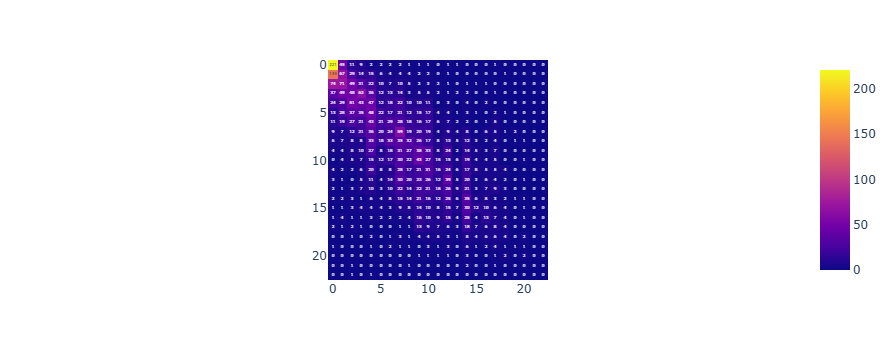

0.3107650643195667


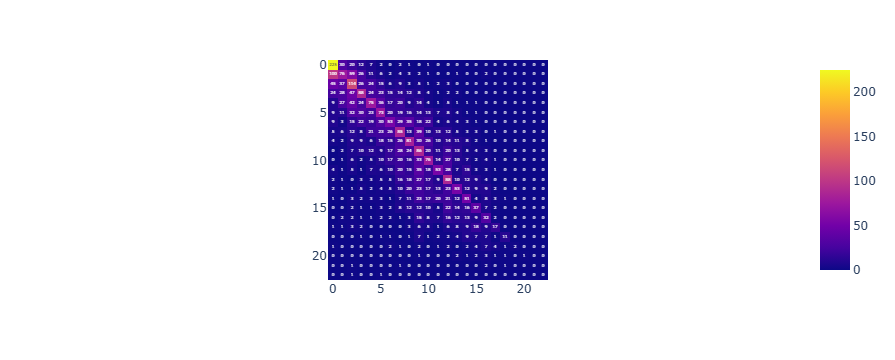

0.8218663180258212


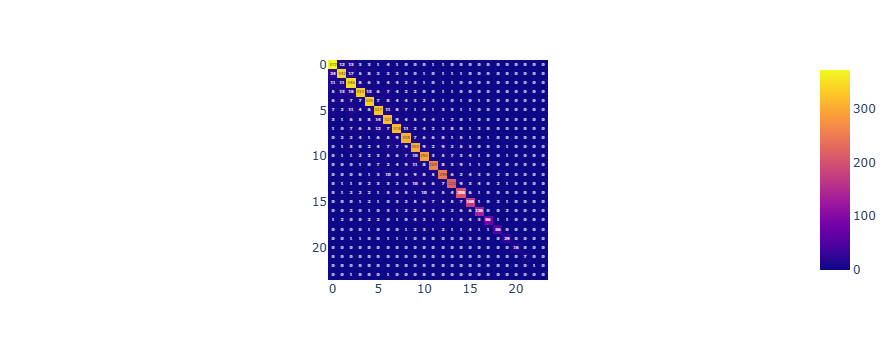

0.820140655394284


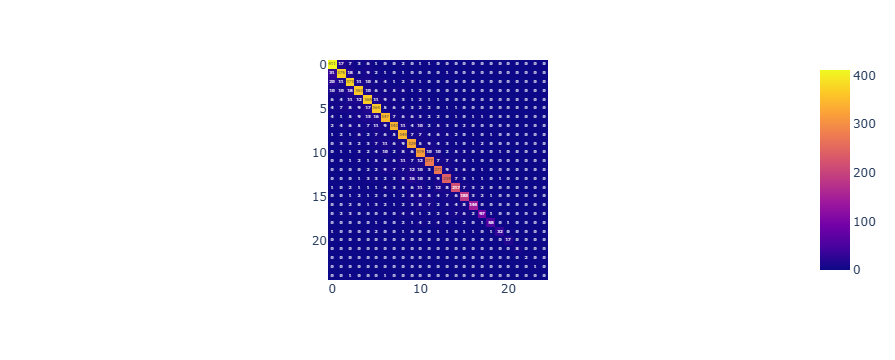

In [94]:
l = ["gridPositionNumber", "qualificationPositionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = LogisticRegression(solver='newton-cg')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["gridPositionNumber", "qualificationPositionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = CategoricalNB()
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["gridPositionNumber", "qualificationPositionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = KNeighborsClassifier(n_neighbors=9, weights='distance', metric='euclidean')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["gridPositionNumber", "qualificationPositionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = RandomForestClassifier(criterion = 'entropy')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

0.09995596653456627


C:\Users\yan_k\anaconda3\Lib\site-packages\sklearn\utils\optimize.py:318: ConvergenceWarning:

newton-cg failed to converge at loss = 2.8452094281203193. Increase the number of iterations.



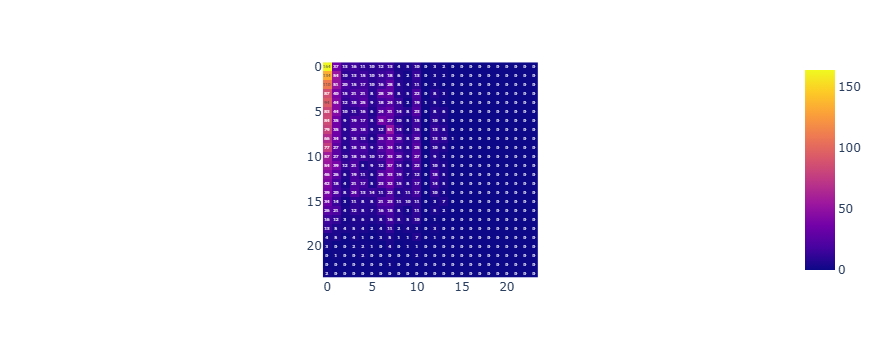

0.2600176133861735


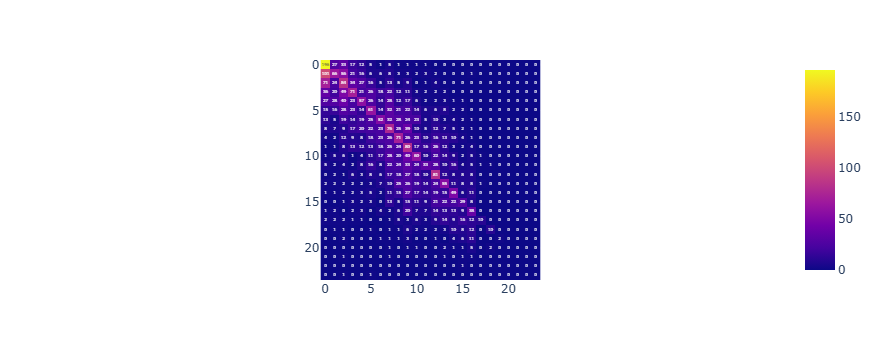

0.8012779552715655


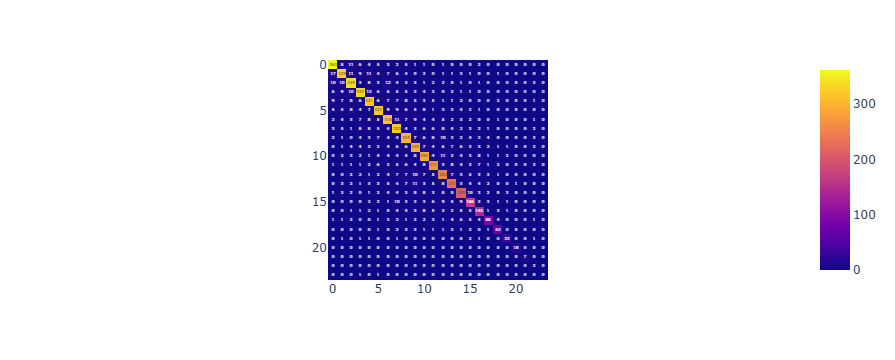

0.7964640561075395


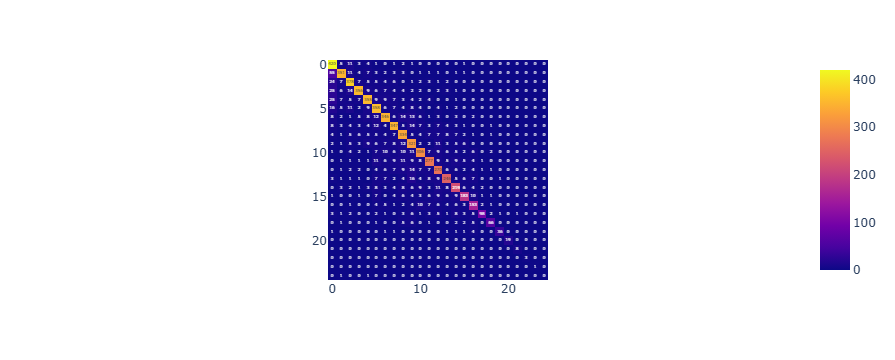

0.8083067092651757


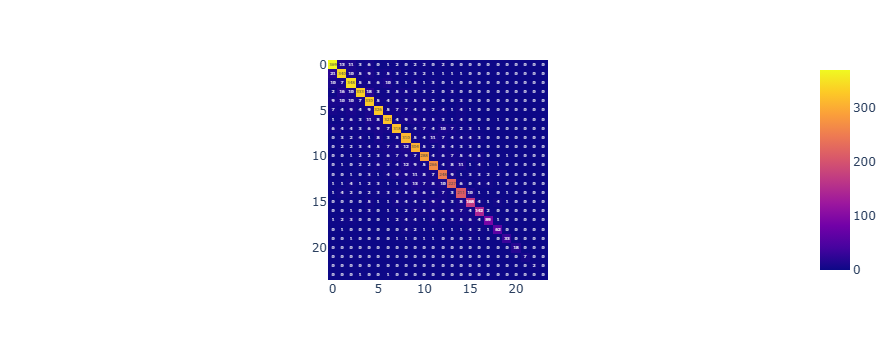

0.8035143769968051


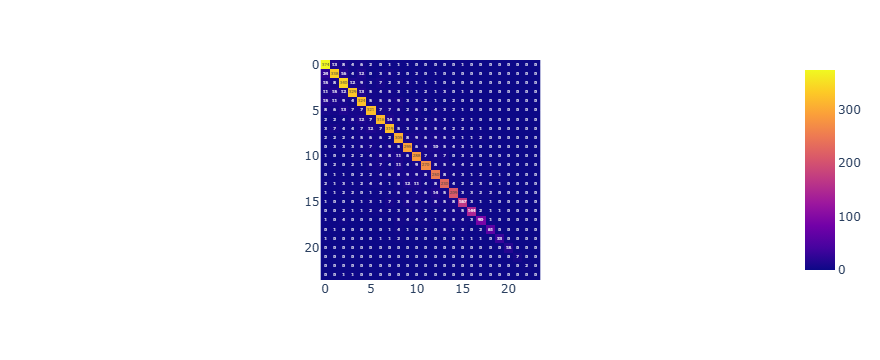

0.48789079700572435


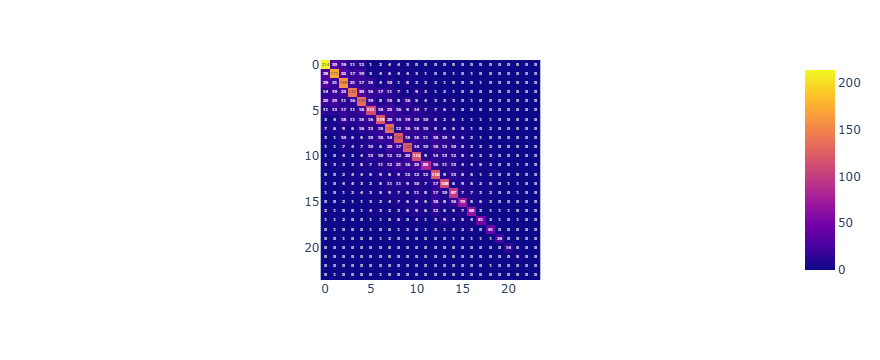

0.48789079700572435


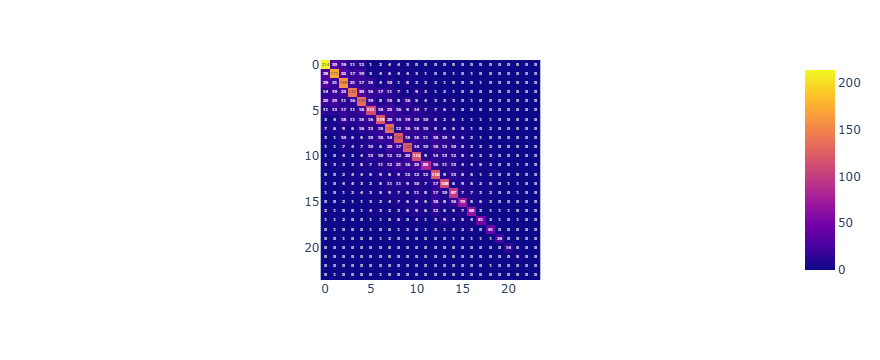

0.8067604533020711


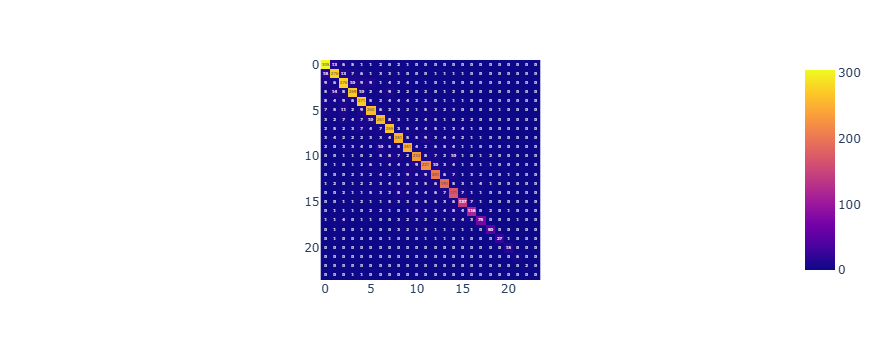

0.7945686900958466


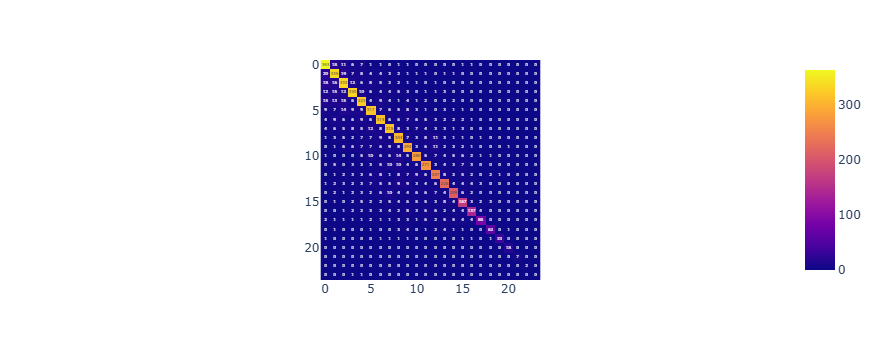

In [89]:
l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = LogisticRegression(solver='newton-cg')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = CategoricalNB()
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = GaussianProcessClassifier()
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = RadiusNeighborsClassifier(radius=8.9, weights='distance', metric='euclidean')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = KNeighborsClassifier(n_neighbors=10, weights='distance', metric='nan_euclidean')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = RandomForestClassifier(criterion = 'entropy')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = GradientBoostingClassifier(loss = 'log_loss')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9", "race-10"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = GradientBoostingClassifier(loss = 'log_loss', criterion = 'friedman_mse')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7", "race-8", "race-9"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = ExtraTreesClassifier(criterion = 'entropy')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

l = ["race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = BaggingClassifier()
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
print(accuracy_score(dfTest["positionNumber"].values, rf.predict(dfVal[l].values)))
conf = confusion_matrix(dfTest["positionNumber"].values, rf.predict(dfVal[l].values))
fig = px.imshow(conf, text_auto=True)
fig.show()

# Predição

## Próxima corrida

### Sem Classificação

13.196246680697346


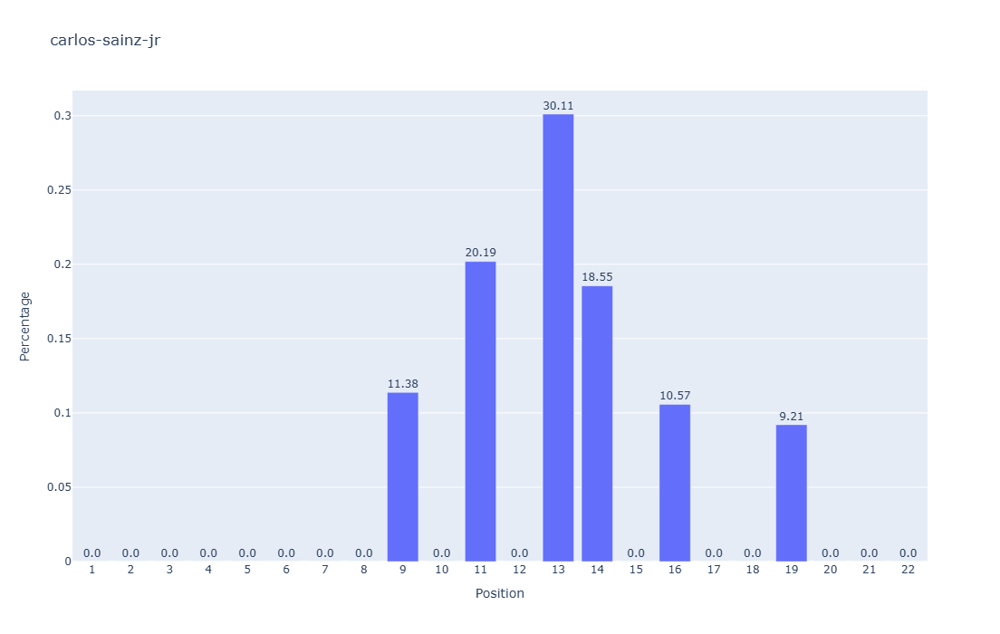

3.852285279656953


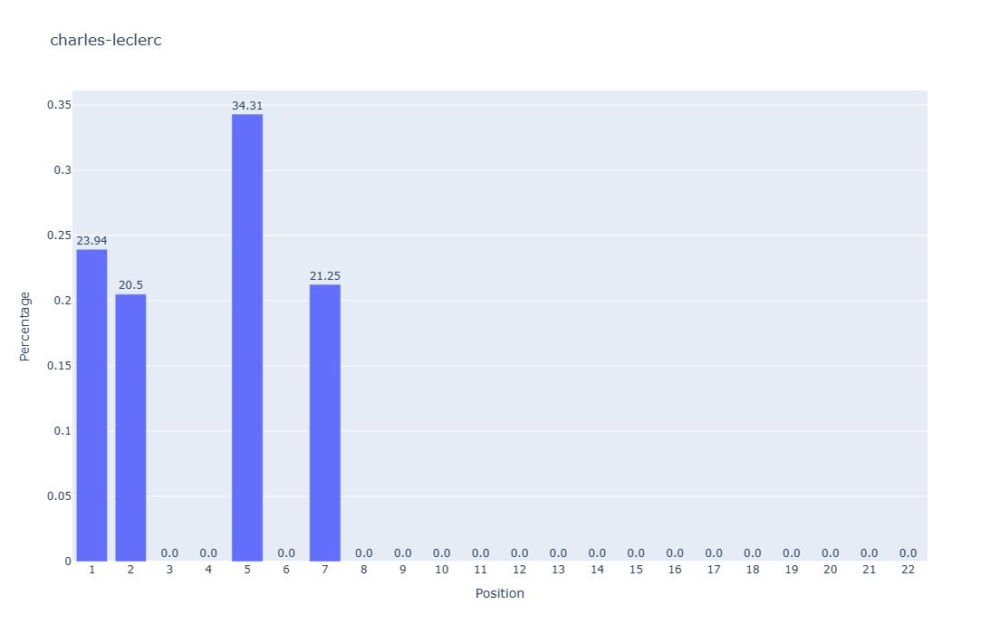

12.69095901427238


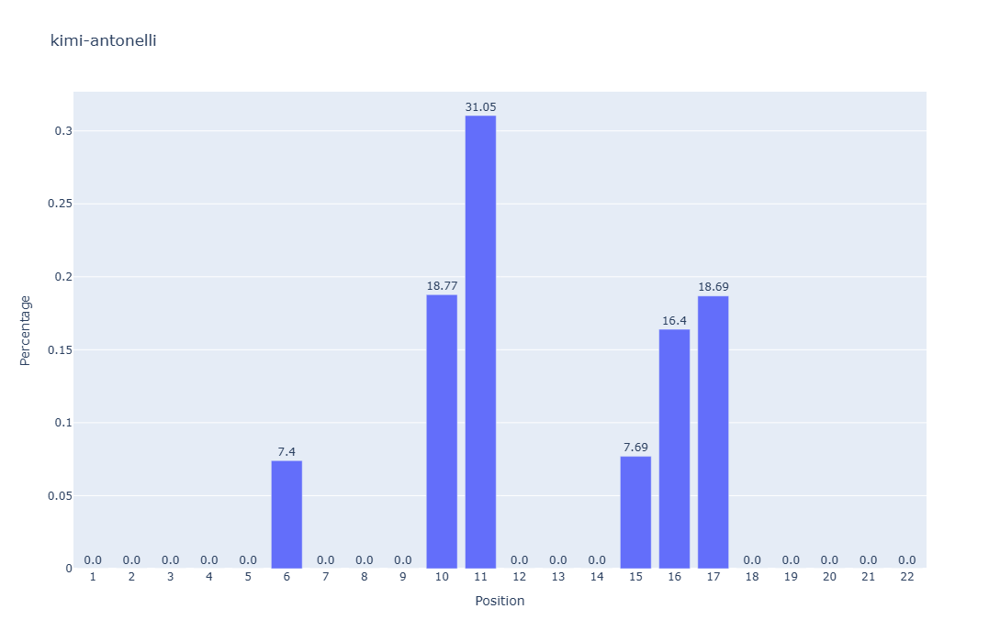

8.91376312744927


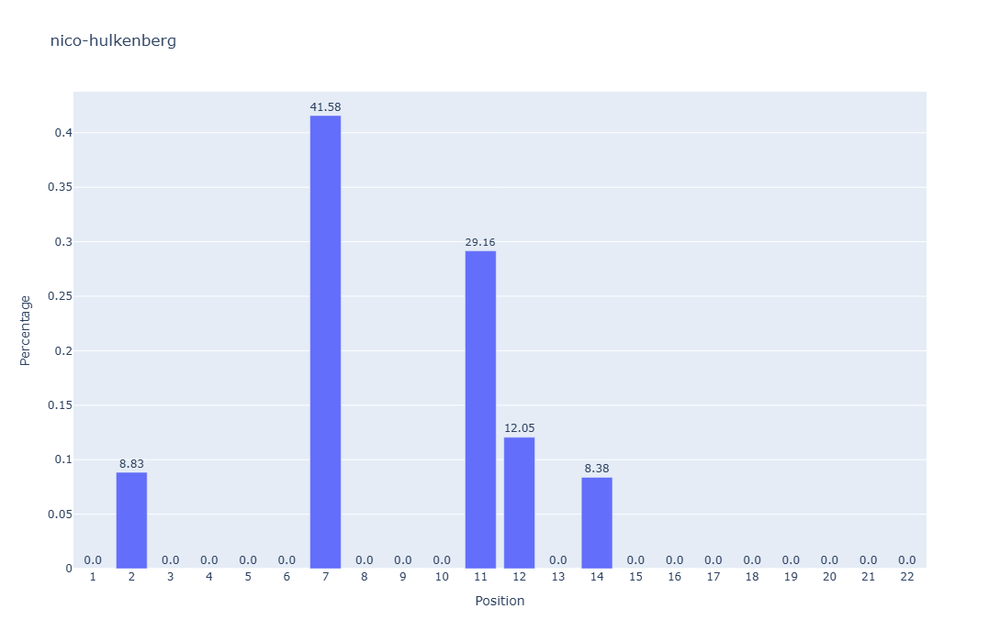

11.327965935994463


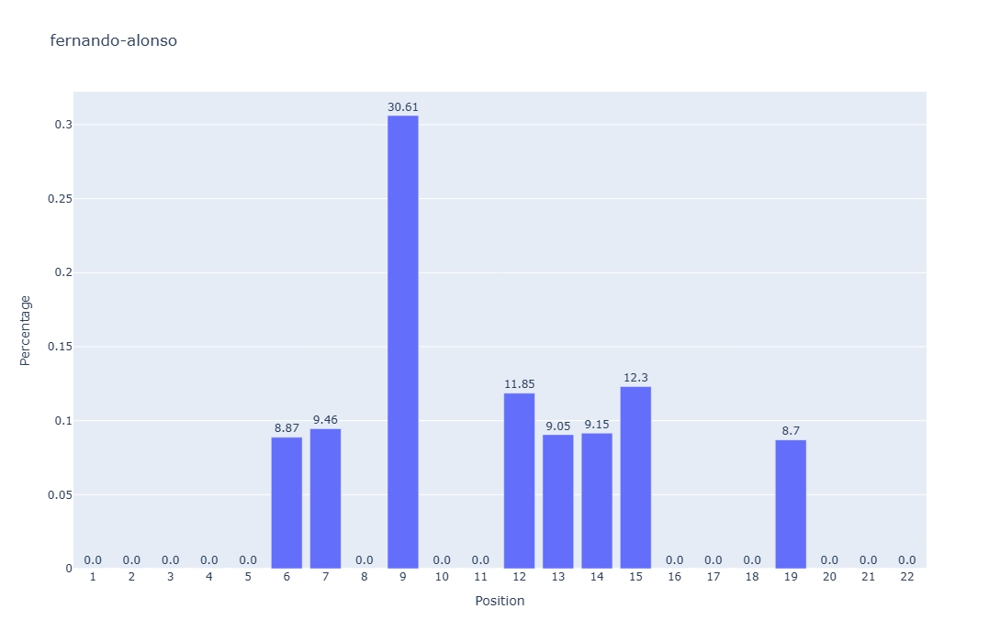

10.278125634017961


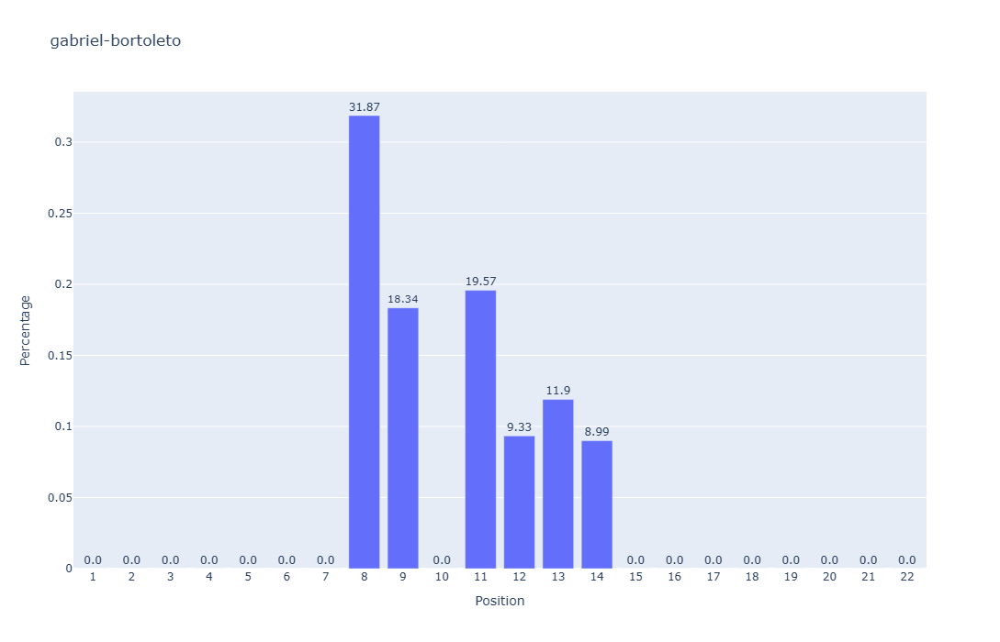

7.975417197517713


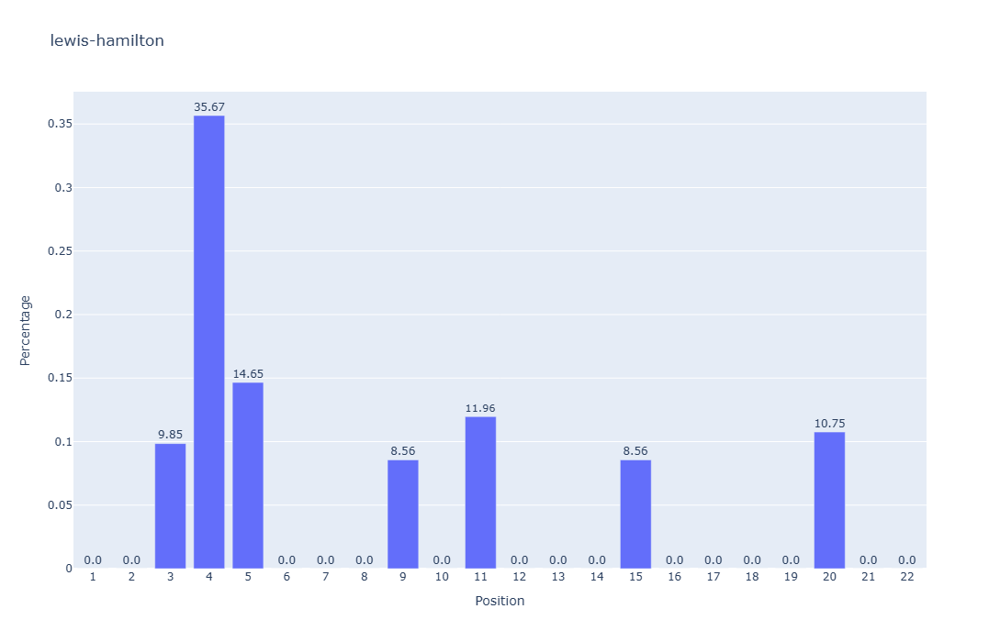

5.293784384141869


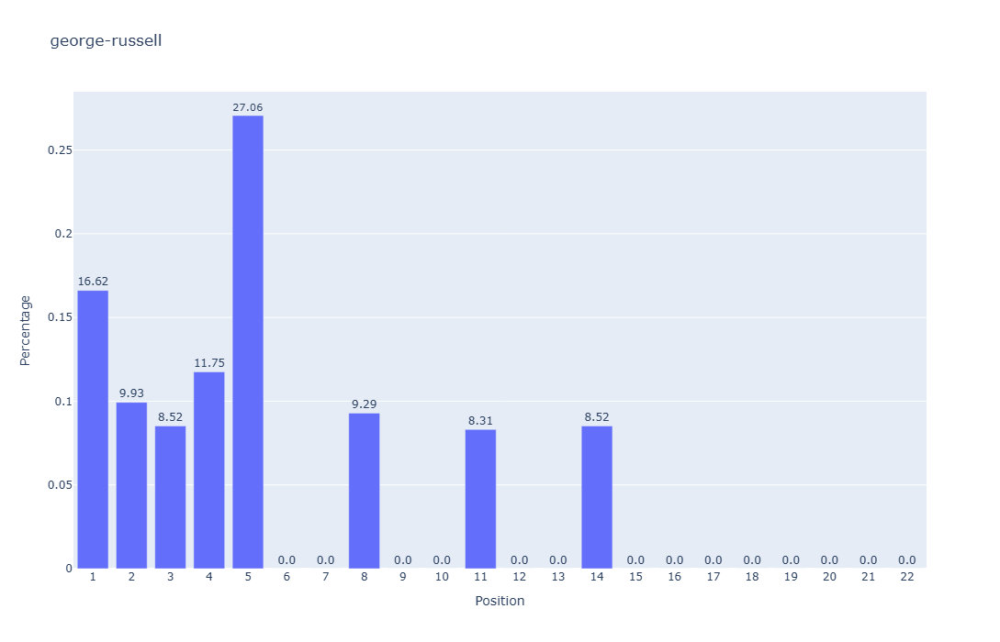

13.20925114787314


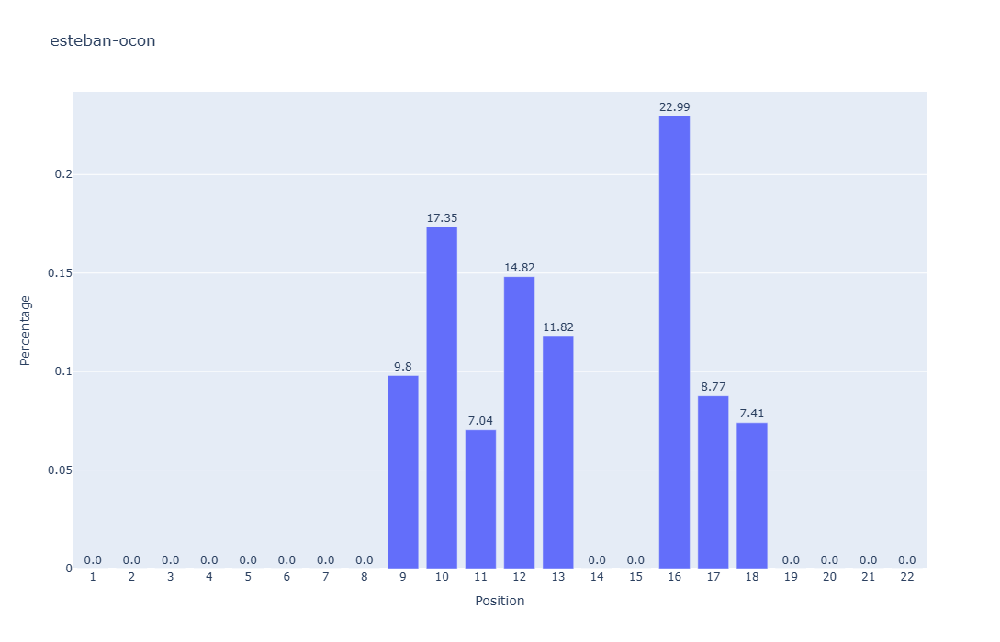

7.573242400619545


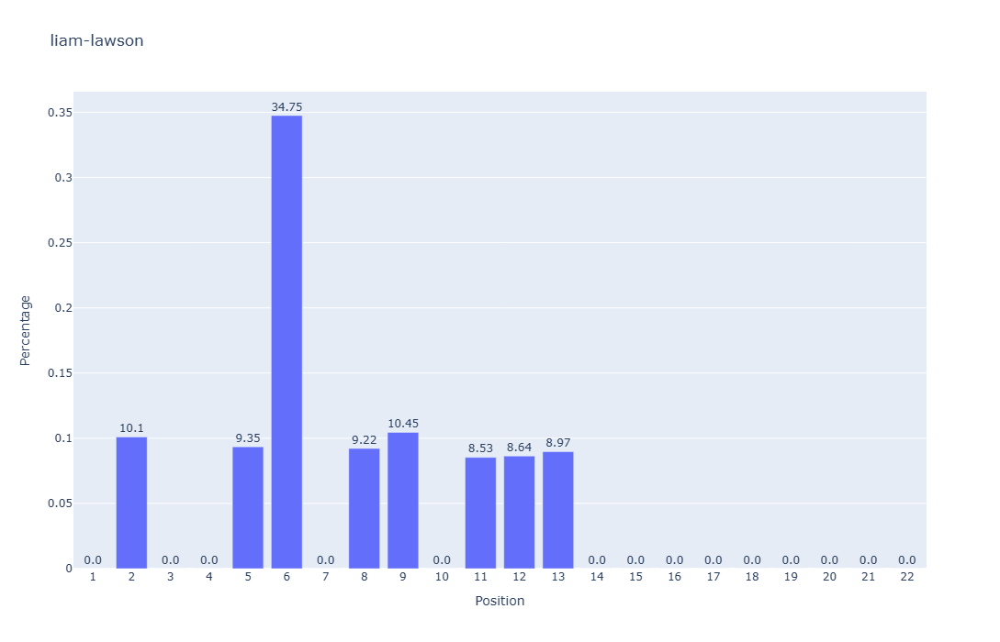

15.132299938011492


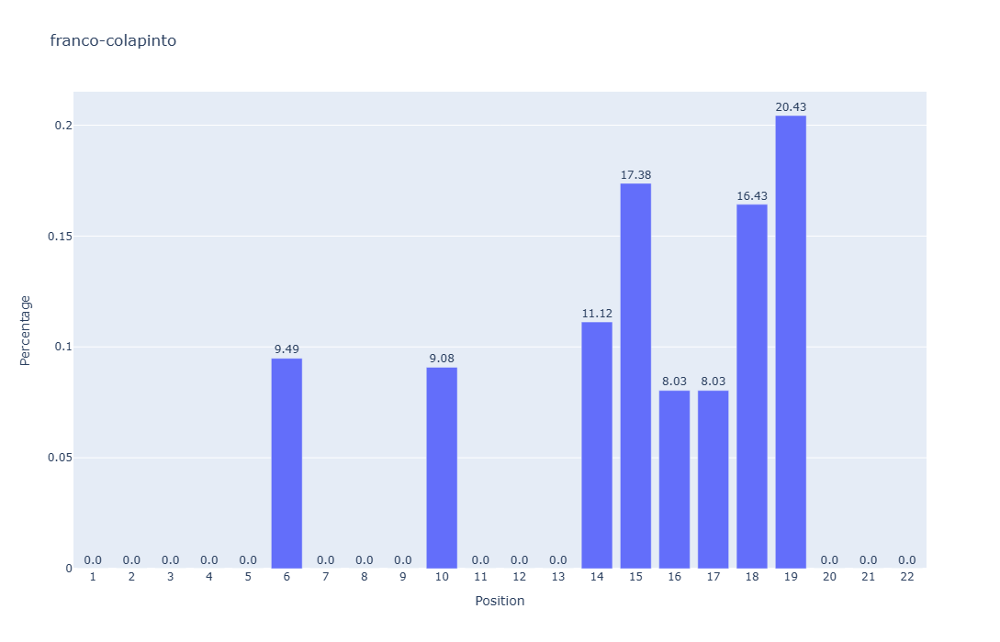

6.465590871785482


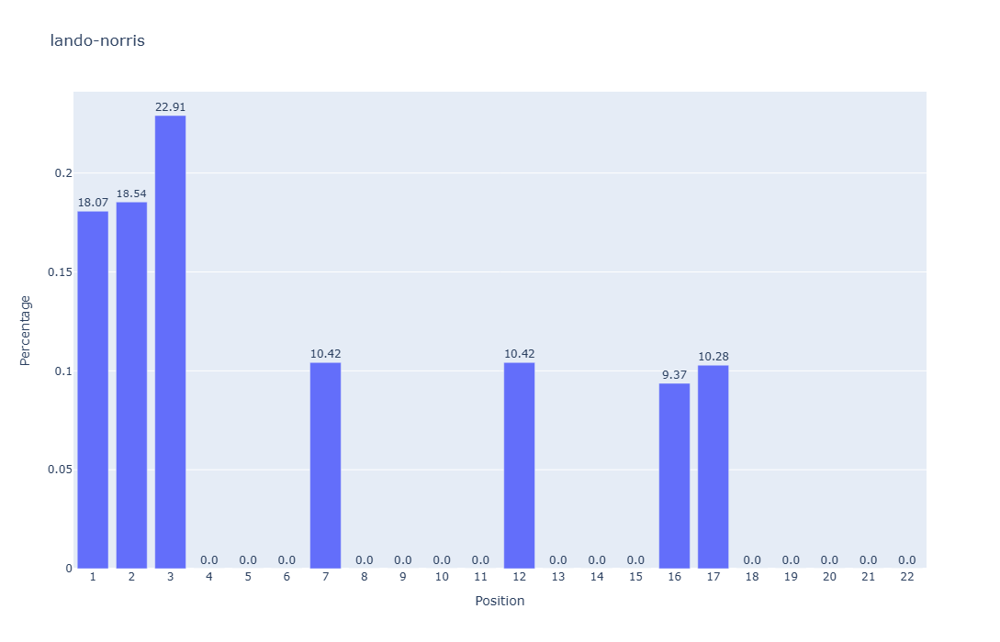

3.489897948556636


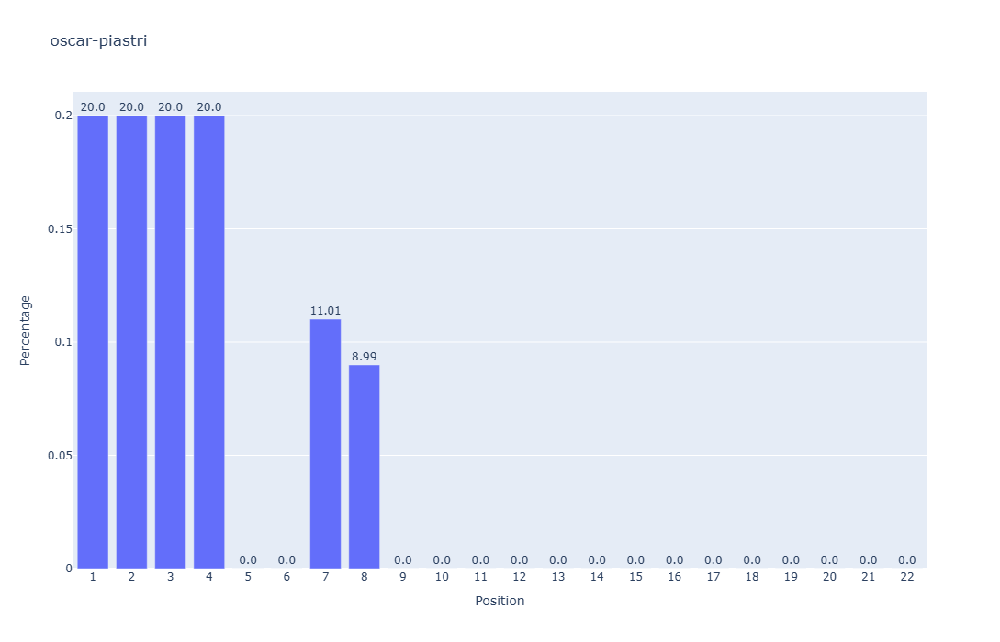

11.642852429753416


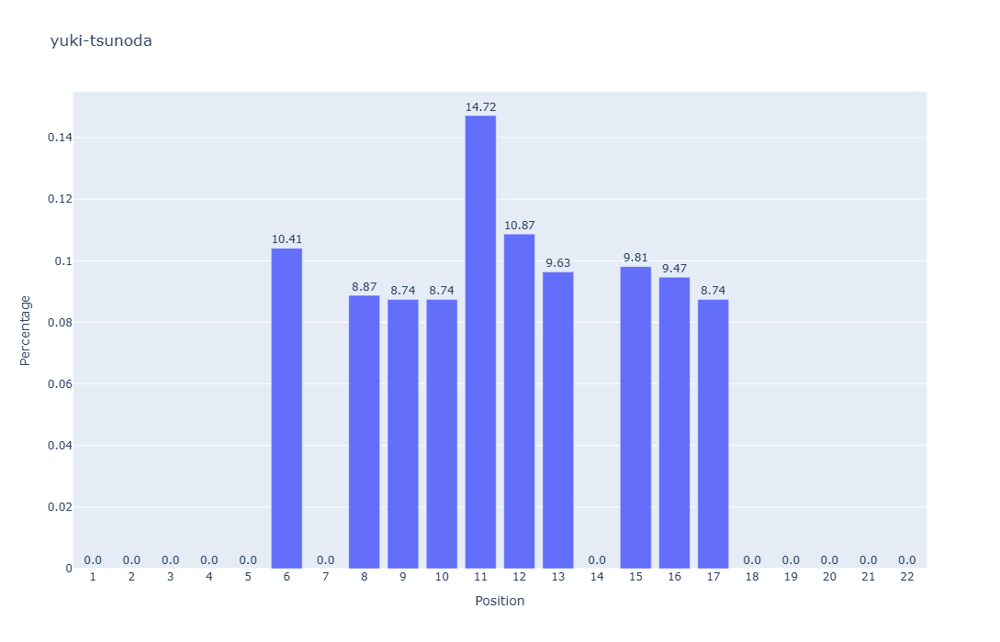

9.484401136346834


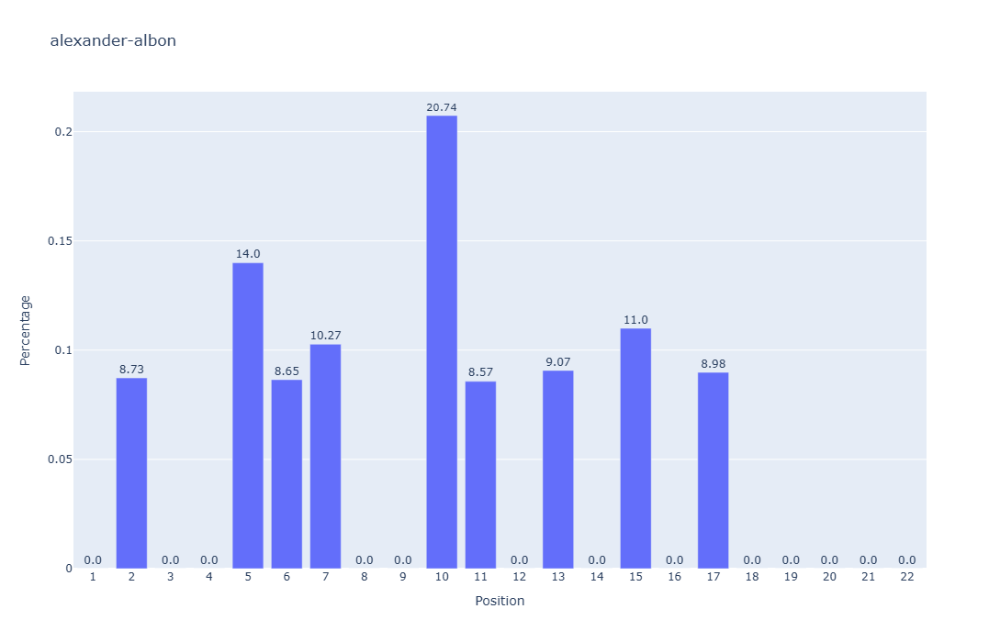

9.45090648794505


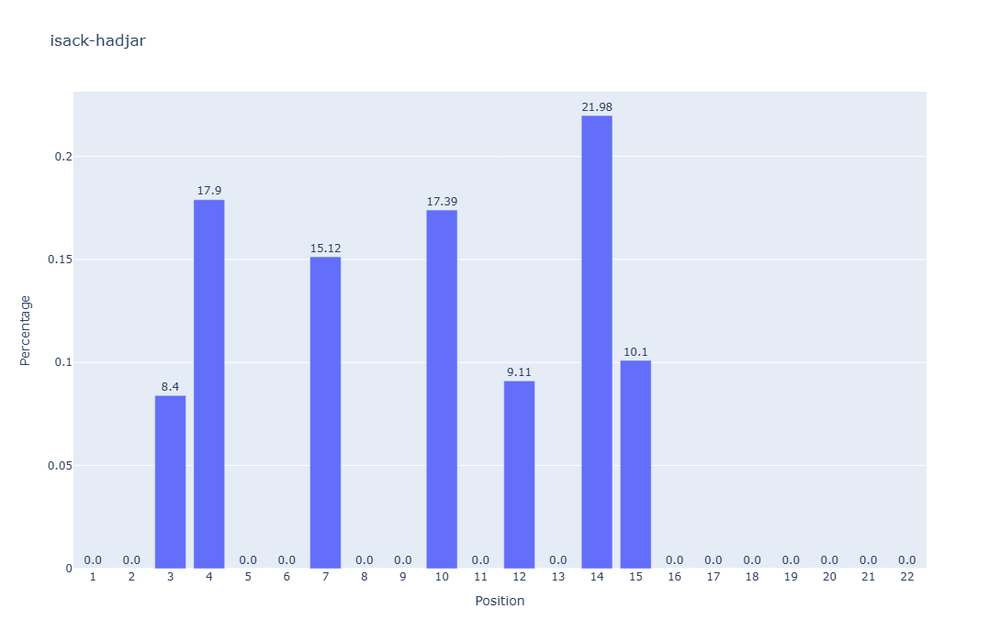

6.5268942901965605


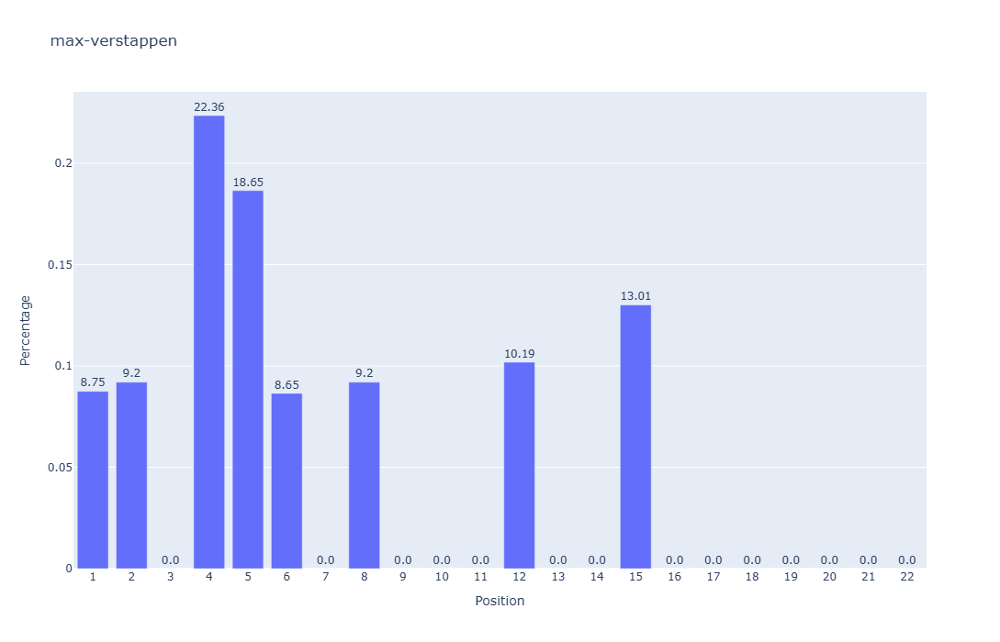

11.111707861252519


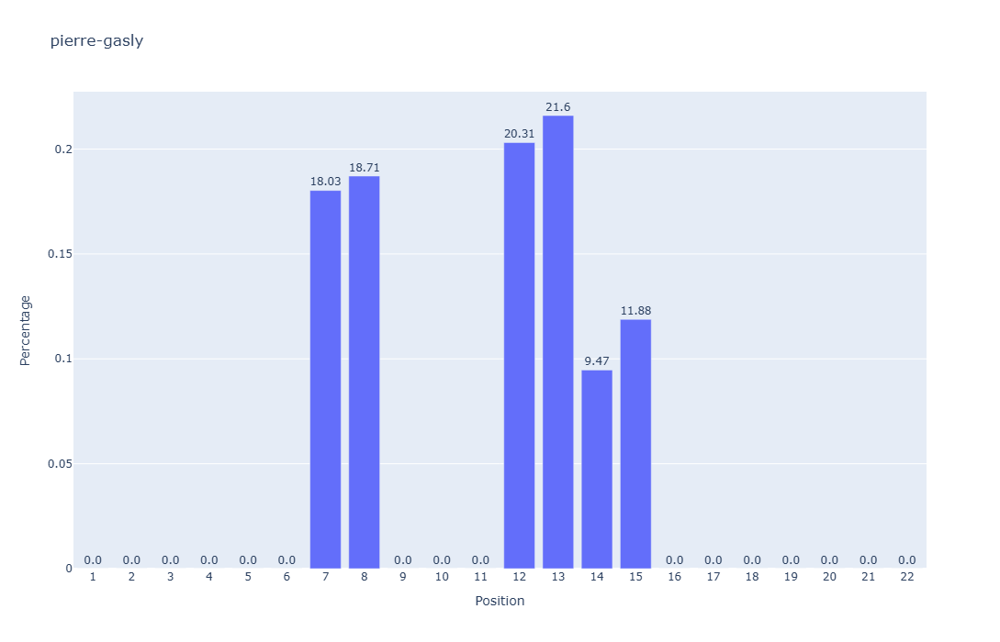

7.77217862037867


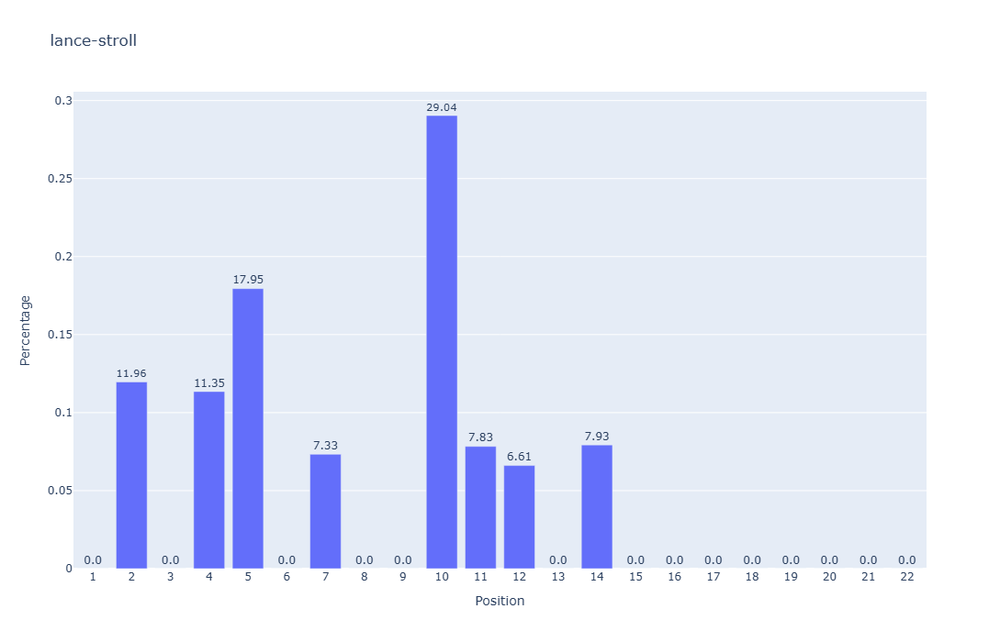

10.141498789039641


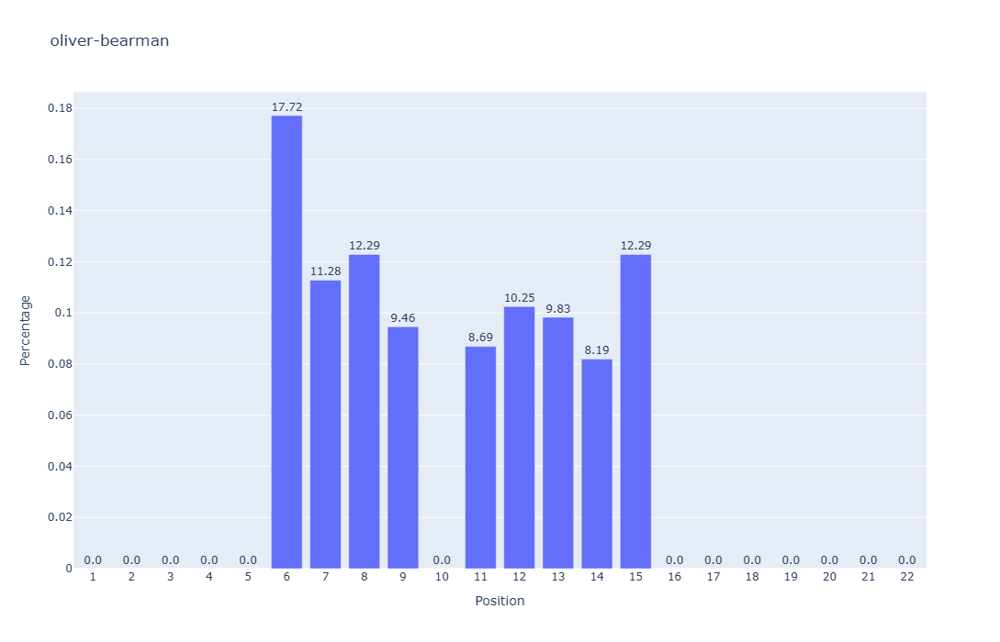

In [35]:
l = ["positionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6", "race-7"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = KNeighborsClassifier(n_neighbors=10, weights='distance', metric='nan_euclidean')
rf.fit(dfTrain[l[1:-1]].values, dfTrain["positionNumber"].values)
dfPred = df1[df1["year"] == 2025]
dfPred = dfPred[(dfPred["round"] == max(dfPred["round"]))]
#print(dfPred)
#dfPred.to_excel("pred.xlsx")
for piloto in dfPred["ID"].unique():
    plot(dfPred[dfPred["ID"] == piloto][l[:-2]], rf, dfPred[dfPred["ID"] == piloto]["driverId"].values.tolist()[0])
# seleciona a ultima corrida
# roda piloto-a-piloto

### Com Classificação

11.370000000000001


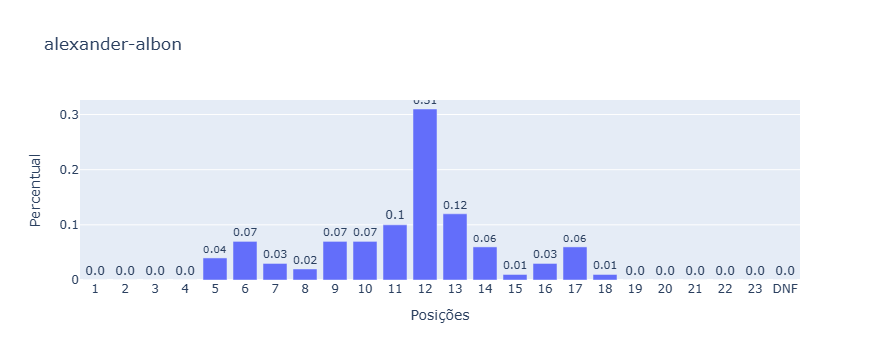

12.67


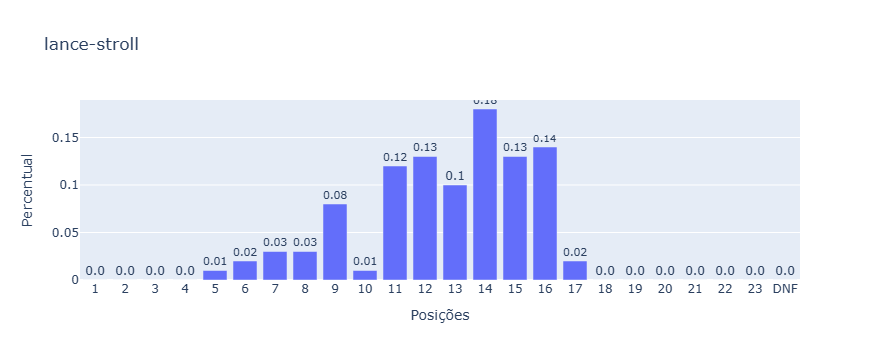

5.5600000000000005


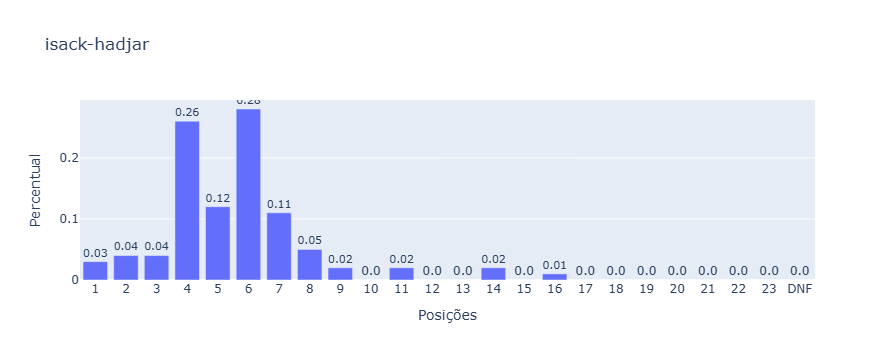

6.39


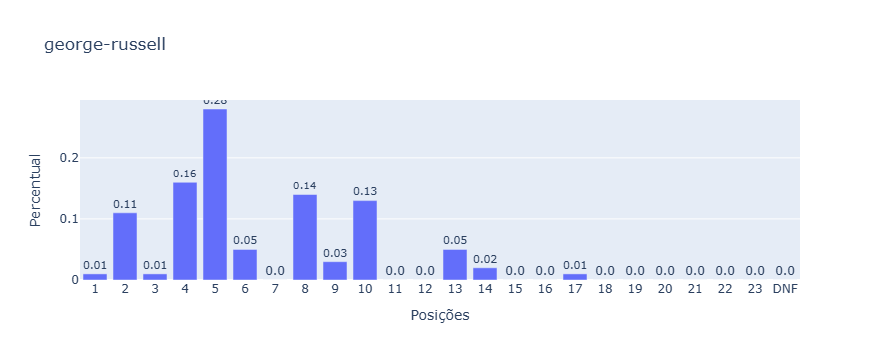

1.8598333333333337


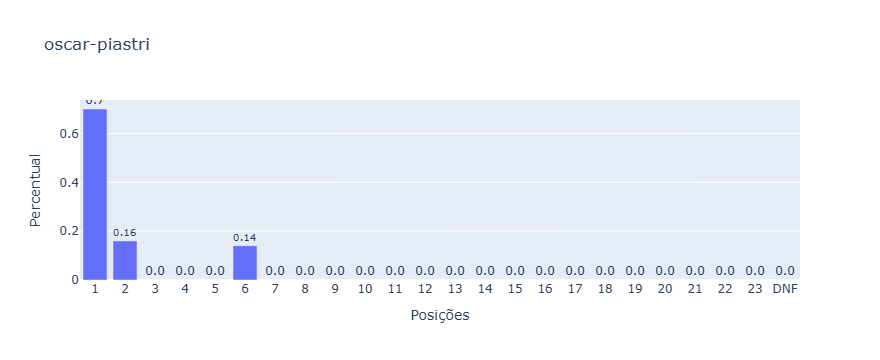

4.68


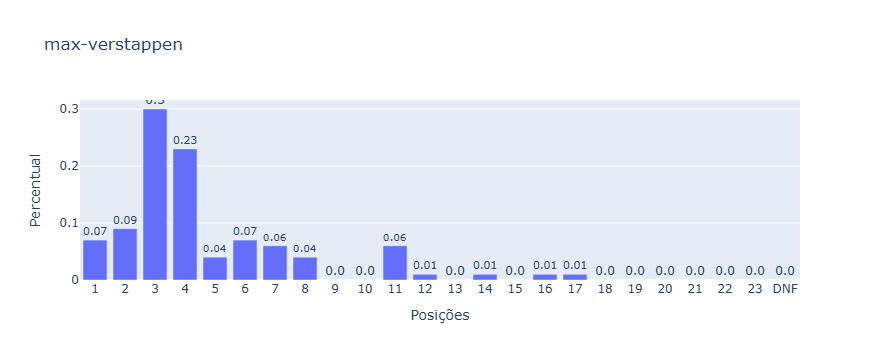

11.95


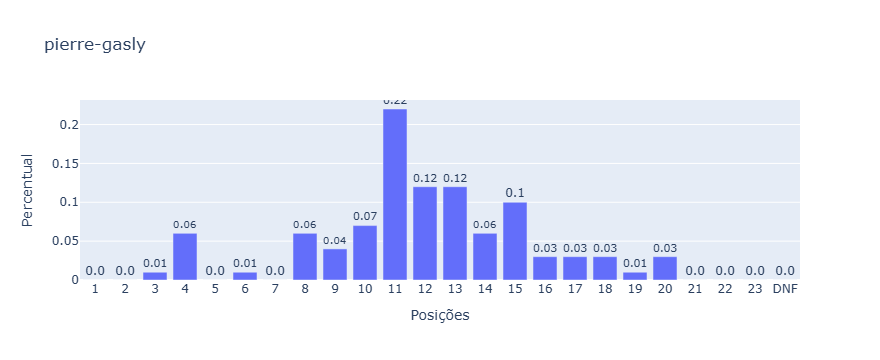

10.879999999999999


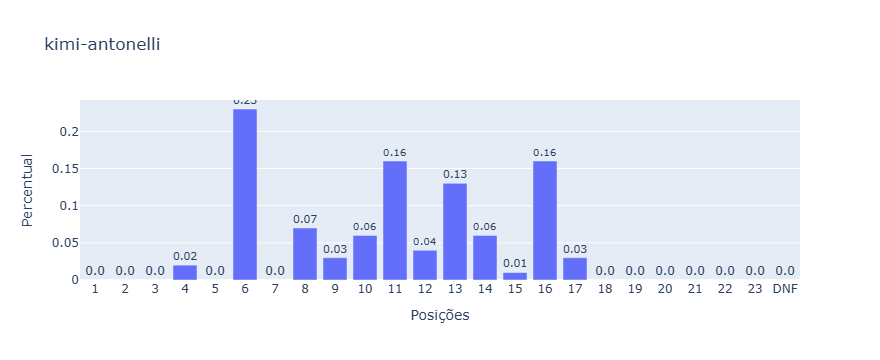

8.146666666666667


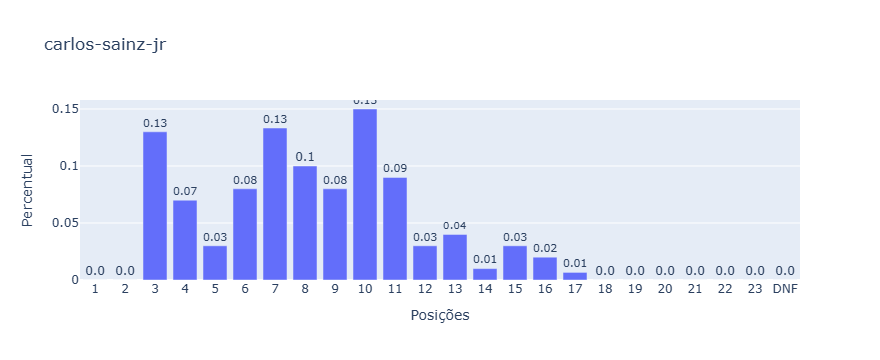

11.17


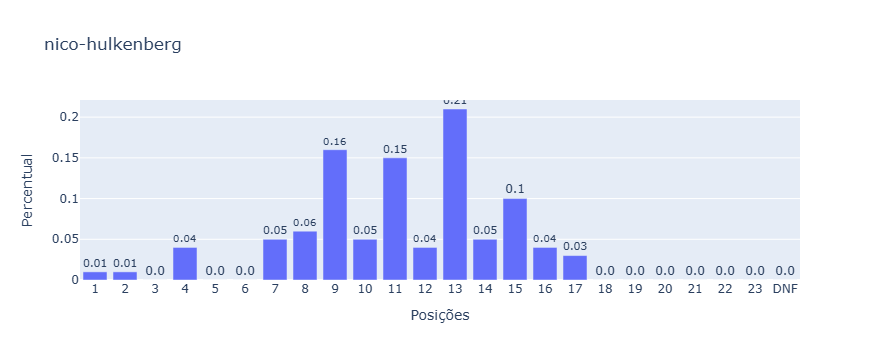

15.090000000000002


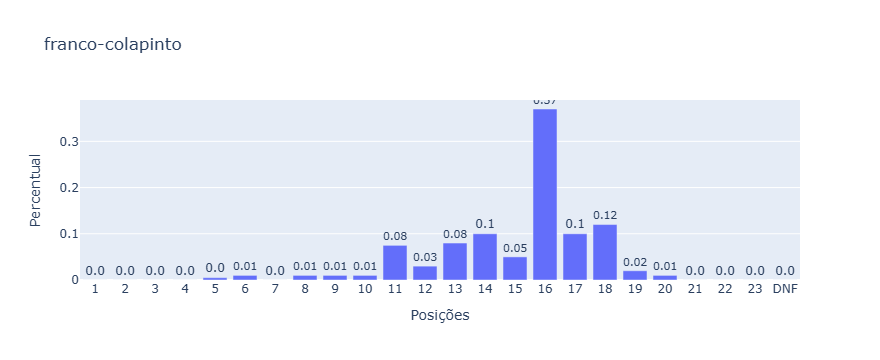

11.530000000000001


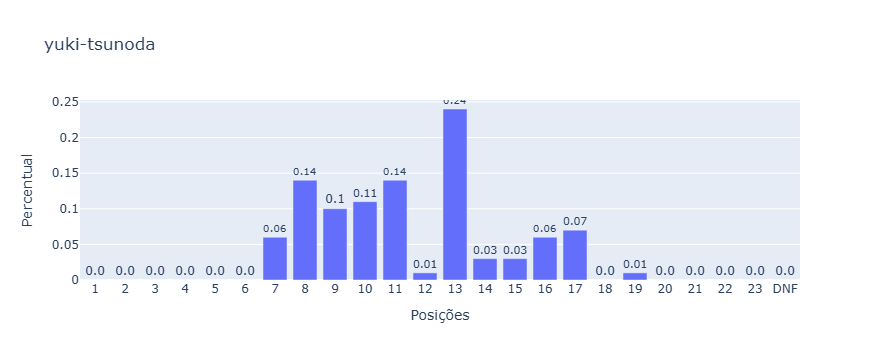

10.34


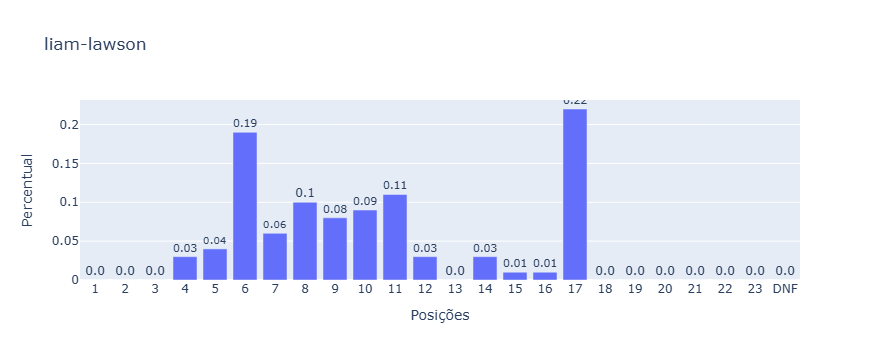

10.5


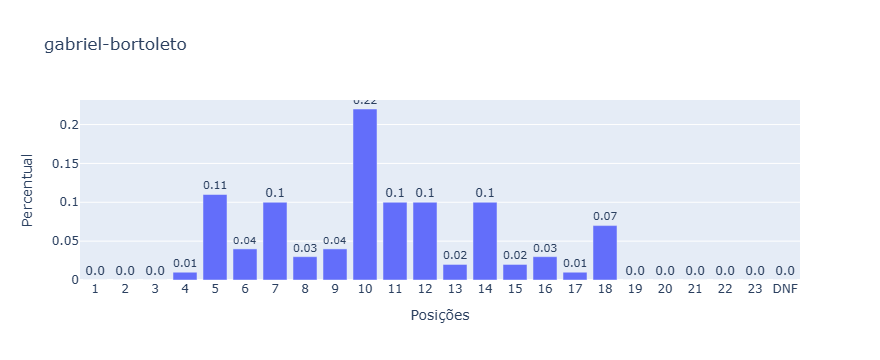

13.43


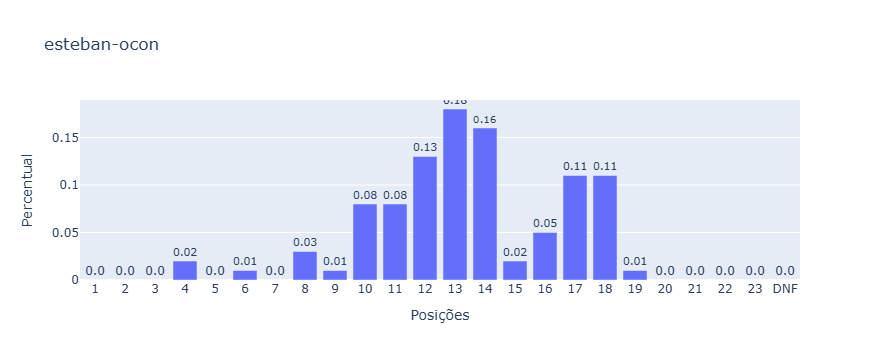

14.13


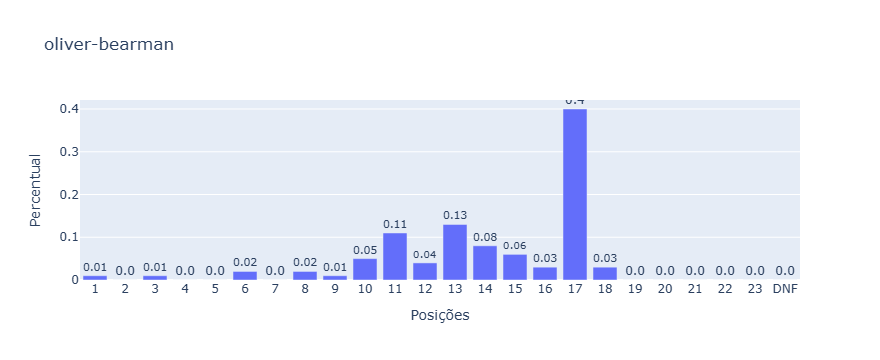

9.370000000000001


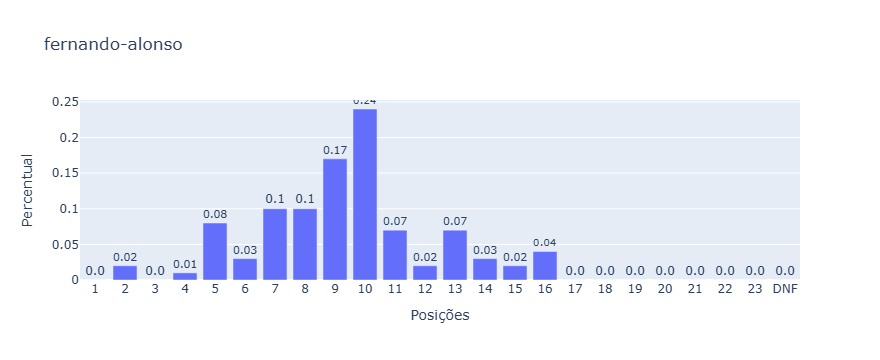

5.870000000000001


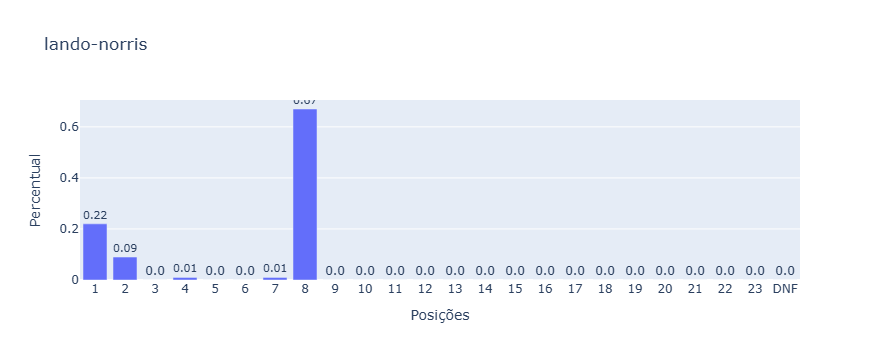

7.05


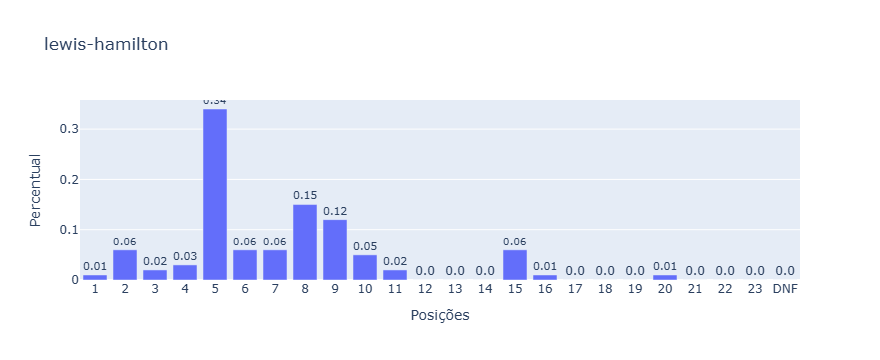

6.33


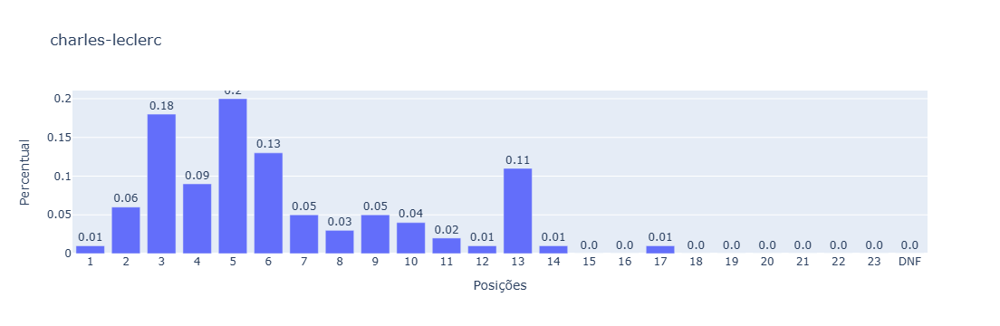

In [131]:
pred = pd.read_excel("pred.xlsx")
l = ["gridPositionNumber", "qualificationPositionNumber", "race-1", "race-2", "race-3", "race-4", "race-5", "race-6"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = RandomForestClassifier(criterion = 'gini')
rf.fit(dfTrain[l[1:-1]].values, dfTrain["positionNumber"].values)
for piloto in dfPred["ID"].unique():
    plot(dfPred[dfPred["ID"] == piloto][l[:-2]], rf, dfPred[dfPred["ID"] == piloto]["driverId"].values.tolist()[0])
#plot()  # forçar a barra aqui
# seleciona a ultima corrida
# roda piloto-a-piloto

## Campeonato (Sem Sprint)

In [103]:
l = ["race-1", "race-2", "race-3", "race-4", "race-5"]
df1 = df.dropna(subset=l)
dfTrain = df1[(df1["year"] <= 2019)]
dfTest = df1[(df1["year"] > 2019) | (df1["year"] <= 2023)]
dfVal = df1[(df1["year"] > 2023) | (df1["year"] <= 2024)]

rf = RandomForestClassifier(criterion = 'gini')
rf.fit(dfTrain[l].values, dfTrain["positionNumber"].values)
#plot
# seleciona a ultima corrida
# roda piloto-a-piloto
# calcula a média de posição da previsão e determina o ranking
# o ranking passa a ser a posição prevista

RandomForestClassifier()

## Campeonato (Com Sprint)